# PRÁCTICA 3 - ALGORITMOS DE OPTIMIZACIÓN BASADO EN HORMIGAS

# Base

## Funciones Base

In [131]:
import os 
import sys
import time
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, clear_output # Nos permitara mostrar la evolucion del algoritmo de hormigas
import networkx as nx
import datetime
from statistics import mean

In [132]:
def tsp_to_matrix(path):
    """
    Convierte un archivo .tsp a una matriz con todas las coordenadas encontradas en el mismo. Cada fila de la matriz correspondera
    a una lista de dos posiciones donde se guardara la coordenada x e y
    
    Parametros
        path : str
            Ruta donde se encuentra el archivo .tsp
            
    Return
        Devuelve un numpy array
    """
    # Comprobamos que exista el fichero
    if os.path.isfile(path):

        # Convertimos los datos en un matriz de dos dimensiones. Donde cada entrada 
        # es la posicion de una ciudad, columna 0 es la 'x' y la columna 1 la 'y'
        with open(path) as f:
            data = f.readlines()

        # Las 5 primeras lineas de los datos se pueden descartar. Y la ultima tambien
        size_data = len(data)
        data = data[6:size_data-1]
        matrix = np.array([])
        for line in data:
            # Dividimos la linea por espacios y seleccionamos las elementos 1 y 2
            aux = line.split(' ')
            
            # Comprobamos que la variable aux tenga 3 valores: [numero, coord x, coord y]
            if len(aux) > 3:
                fix_aux = []
                for c in aux: # Character en aux
                    # Descartamos los espacios
                    if c != '' and c != ' ': 
                        fix_aux += [c]
                        
                aux = fix_aux
            
            pos = np.array([float(aux[1]), float(aux[2])])

            if len(matrix) != 0:
                matrix = np.append(matrix, [pos], axis=0)
            else:
                matrix = np.array([pos])

        return matrix
    else:
        raise Exception("The file it doesn't exist")
        


In [133]:
def euclidean_distance(coord_node_a, coord_node_b):
    """
    Calcula la distancia euclidea entre dos nodos
    
    Parametros
        coord_node_a : list
            Lista de dos posiciones con las coordenadas x e y del primer nodo. Ejemplo: [x,y]
        coord_node_b : list
            Lista de dos posiciones con las coordenadas x e y del segundo nodo. Ejemplo: [x,y]
            
    Return
        Devuelve la distancia calculada redondeada(int)
    """
    xd = coord_node_a[0] - coord_node_b[0]
    yd = coord_node_a[1] - coord_node_b[1]
    return round(np.sqrt(xd*xd + yd*yd), 3) # Redondeamos con 3 decimales

In [134]:
def create_sh_graph(m):
    """
    A partir de una matriz de coordenadas, se creara un grafo interconectando todos los nodos.
    
    Atributos de cada nodo:
        
        -'coord': lista de dos posiciones con las coordenadas x e y del nodo. Ejemplo: [x,y]
        -'nearest': lista de nodos mas cercanos al nodo. 
    
    Atributos de cada arista:
    
        -'distance': distancia entre los nodos que la forman
        -'pheromone': cantidad de feromonas que tiene la arista
        -'heuristic': heuristica de la arista
        
    Parametros
        m : numpy ndarray
            Matriz de coordenadas, donde cada fila es igual a una lista de dos valores: [x,y]
        init_pheromone : float
            Valor inicial de feromonas que tendra la arista
            
    Return
        Devuelve un objeto networkx
    """
    # Creamos el grafo
    g = nx.Graph()
    nodes_n = len(m) # Numero de nodos a crear
    
    # Creamos una lista de strings para nombrar los nodos y los aniadimos
    nodes_list = [] # Lista con los nombres
    for i in range(0,nodes_n):
        nodes_list += [f"Node_{i}"] # Guardamos el nombre
        g.add_node(nodes_list[i]) # Aniadimos el nodo
        g.nodes[nodes_list[i]]["coord"] = m[i] # Le asignamos las coordenadas
    
    # Aniadimos las aristas, interconectamos todos los nodos
    for i in range(0,nodes_n):
        for j in range(i+1,nodes_n):
            g.add_edge(nodes_list[i], nodes_list[j]) # Creamos la arista
            ed = euclidean_distance(g.nodes[nodes_list[i]]["coord"],g.nodes[nodes_list[j]]["coord"]) # Euclidean distance

            if ed != 0: # Preguntamos si la distancia entre ciudades es cero porque en el fichero a280.tsp dos ciudades tiene las mismas coordenadas
                h = 1 / ed # La  heuristica es igual a: 1 / distancia_entre_nodos
            else:
                h = 0
            g.edges[nodes_list[i], nodes_list[j]]["distance"] = ed # Guardamos
            g.edges[nodes_list[i], nodes_list[j]]["heuristic"] = h 
            g.edges[nodes_list[i], nodes_list[j]]["pheromone"] = 0 # Guardamos el valor de pheromonas inicial
            
    # Hacemos que cada nodo tenga una lista ordenada de los nodos mas cercanos
    for i in range(0,nodes_n):
        edges = list(g.edges(nodes_list[i])) # Conseguir aristas, transformamos objeto EdgeDataView a list()
        
        # Creamos una lista con las distancias de cada una de las aristas
        distances = []
        for j in range(0,len(edges)):
            edge_start = edges[j][0] # Nodo inicial de la arista - Arista j, elemento 0 (nodo inicial)
            edge_end = edges[j][1] # Nodo final de la arista - Arista j, elemento 1 (nodo final)
            edge_attributes = g.get_edge_data(edge_start,edge_end) # Devuelve un diccionario con los atributos de la arista
            distances += [edge_attributes["distance"]] # Conseguimos el atributo deseado y lo guardamos en la lista
        
        # Ordenamos las aristas de menor a mayor distancia. Para ello comprobamos cual es la que tiene menor valor y aniadimos el final a la lista
        distances = np.array(distances) # Convertimos a un array numpy
        tidy_edges = [] # Aristas ordenadas por coste de menor a mayor
        max_value = distances.max() + 1 # Fijamos un numero maximo, de forma que cuando guardemos una arista. No vuelva a ser seleccionada
        for j in range(0,len(edges)):
            argmin = distances.argmin() # Seleccionamos la posicion del valor mas pequenio
            tidy_edges += [edges[argmin][1]] # Seleccionamos la arista con argmin y luego seleccionamos el nodo final de la arista
            distances[argmin] = max_value
            
            
        # Aniadimos la lista al nodo
        g.nodes[nodes_list[i]]["nearest"] = tidy_edges
            
    return g
    

In [135]:
def check_edge_in(g, edge):
    """
    Comprueba si existe un arista en uno de los dos sentidos y te devuelve la misma
    """
    one_direction = None
    second_direction = None
    try:
        exist = g.edges[edge[0],edge[1]]
        one_direction = True
    except:
        one_direction = False
        
    try:
        exist = g.edges[edge[1],edge[0]]
        second_direction = True
    except:
        second_direction = False
        
    if one_direction == True or second_direction == True:
        return True
    else:
        return False

In [136]:
def normalize_data(data,max_value):
    """
    Normaliza una lista de numero entre 0 y el numero facilitado por parametro
    
    Parametros
        data : list
            Lista de numeros
        max_value : int
            Numero maximo que tendra la lista de valores normalizados
    
    Return 
        Devuelve la lista normalizada
    """
    return ((data - np.min(data)) / (np.max(data) - np.min(data))) * max_value

In [137]:
def normalize_x(x, max_value, min_value):
    """
    Normaliza un valor entre dos valores
    
    Parametros
        x : float
            Valor a normalizar
        max_value : float
            Valor de rango maximo
        min_value : float
            Valor de rango minimo
        
    Return valor normalizado
    """
    return (x - min_value) / (max_value - min_value)

## Dibujar por pantalla

In [138]:
def draw_route(g, route, cost, path):
    """
    Muestra por pantalla la ruta en el grafo
    
    Parametros
        g : networkx
            Grafo de hormigas
        route : str list
            Lista con los nombres de los nodos recorridos
        cost : int
            Coste de la ruta recorrida
    """
    
    # OBTENEMOS TODAS LAS COORDENADAS
    nodes_list = list(g.nodes)
    x = [] # Lista de coordenadas x
    y = [] # Lista de coordenadas y
    for node in nodes_list:
        coord = g.nodes[node]['coord'] # Seleccionamos las coordenadas de un nodo
        x += [coord[0]] # Coord 0 es la coordenada x
        y += [coord[1]] # Coord 1 es la coordenada y
    
    xr = []
    yr = []
    for i in range(0,len(route)):
        coord = g.nodes[route[i]]['coord']
        xr += [coord[0]]
        yr += [coord[1]]
    
    ax = plt.figure(figsize=(14, 8))
    ax.set_facecolor('white')
    plt.title(f"Coste del camino: {round(cost,3)}")
    
    plt.plot(xr,yr,"blue") # Dibujamos la linea continua que une los puntos
    plt.scatter(x,y, c = "black") # Dibujamos todos los puntos
    plt.scatter(xr[0],yr[0],c="green") # Resaltamos el nodo inicial
    plt.scatter(xr[-1],yr[-1],c="red") # Resaltamos el nodo final
    
    plt.legend(["Ruta","Ciudades","Ciudad inicial","Ciudad final"])
    plt.savefig("./study/"+path+".png", dpi=100)
    plt.show() 
    

In [139]:
def draw_route_steps(g, route):
    """
    Muestra por pantalla la ruta en el grafo paso por paso
    
    Parametros
        g : networkx
            Grafo de hormigas
        route : str list
            Lista con los nombres de los nodos recorridos
        
    """
    fig = plt.figure(figsize=(14,8))
    ax = fig.add_subplot(1, 1, 1) 
    ax.set_facecolor('white')
    
    # OBTENEMOS TODAS LAS COORDENADAS
    nodes_list = list(g.nodes)
    x = [] # Lista de coordenadas x
    y = [] # Lista de coordenadas y
    for node in nodes_list:
        coord = g.nodes[node]['coord'] # Seleccionamos las coordenadas de un nodo
        x += [coord[0]] # Coord 0 es la coordenada x
        y += [coord[1]] # Coord 1 es la coordenada y
    
    
    # Dibujamos todos los puntos
    ax.scatter(x,y, c = "black") # Dibujamos todos los puntos
    ax.scatter(x[0],y[0],c="green") # Resaltamos el nodo inicial

    for i in range(2, len(route)+1): # Empezamos en 2 para que en la primera vez represente el primer paso        
        # Dibujamos la ruta
        if i !=2 :
            xs = x[i-3:i-1] 
            ys = y[i-3:i-1]
            ax.plot(xs,ys,c="blue") # Dibujamos la linea continua que une los puntos
        
        # Resaltamos el ultimo paso realizado
        ax.plot(x[i-2:i],y[i-2:i],c="red") # Dibujamos la linea continua que une los puntos
        
        # Reseteamos la pantalla
        display(fig)    
        clear_output(wait = True)
        plt.pause(0.0001)
    
    ax.plot(x[i-3:i-1],y[i-3:i-1],c="blue") 
    ax.plot(x[-2:],y[-2:],c="red")
    ax.scatter(x[-1],y[-1],c="red") # Resaltamos el nodo final
    display(fig)  
'''
g = nx.read_gpickle("./build_graph/graph_ch130.gpickle")
route, route_cost = greedy(g)
draw_route_steps(g, route)
'''

'\ng = nx.read_gpickle("./build_graph/graph_ch130.gpickle")\nroute, route_cost = greedy(g)\ndraw_route_steps(g, route)\n'

In [140]:
def draw_pheromones(g):
    """
    """
    fig = plt.figure(figsize=(16,10))
    ax = fig.add_subplot(1, 1, 1) 
    ax.set_facecolor('white')
    
    # OBTENEMOS TODAS LAS COORDENADAS
    nodes_list = list(g.nodes)
    x = [] # Lista de coordenadas x
    y = [] # Lista de coordenadas y
    for node in nodes_list:
        coord = g.nodes[node]['coord'] # Seleccionamos las coordenadas de un nodo
        x += [coord[0]] # Coord 0 es la coordenada x
        y += [coord[1]] # Coord 1 es la coordenada y
    
    
    # Dibujamos todos los puntos
    ax.scatter(x,y, c = "black") # Dibujamos todos los puntos
    ax.scatter(x[0],y[0],c="green") # Resaltamos el nodo inicial
    
    pheromones = np.array([])
    pheromones_norm = np.array([])
    draw_edges = 0
    start = time.time()
    for edge in g.edges:
        xe = []
        ye = []
        p = g.edges[edge]['pheromone']
        pheromones = np.append(pheromones, p)
        pheromones_norm = np.append(pheromones_norm, 1000000*p)
        #if pheromones_norm[-1] >= np.mean(pheromones_norm):
        xe += [g.nodes[edge[0]]['coord'][0]]
        xe += [g.nodes[edge[1]]['coord'][0]]
        ye += [g.nodes[edge[0]]['coord'][1]]
        ye += [g.nodes[edge[1]]['coord'][1]]
        ax.plot(xe,ye,c="blue", linewidth=6000*pheromones[-1])
        draw_edges += 1
    total_time = time.time()-start
    print(f"Tiempo: {total_time/60} min")
    ax.set_title(f"Mapa de feromonas - Aristas representadas {draw_edges}/{g.number_of_edges()}")
    plt.savefig("./study/"+path+".png", dpi=100)

In [141]:
def draw_pheromones_by_node(g, density, path):
    """
    """
    # COMPROBAMOS QUE DENSITY NO SUPERE EL NUMERO MAXIMO DE NODOS
    if density > g.number_of_nodes():
        density = g.number_of_nodes()
    
    fig = plt.figure(figsize=(18,12))
    ax = fig.add_subplot(1, 1, 1) 
    ax.set_facecolor('white')
    
    # OBTENEMOS TODAS LAS COORDENADAS
    nodes_list = list(g.nodes)
    x = [] # Lista de coordenadas x
    y = [] # Lista de coordenadas y
    for node in nodes_list:
        coord = g.nodes[node]['coord'] # Seleccionamos las coordenadas de un nodo
        x += [coord[0]] # Coord 0 es la coordenada x
        y += [coord[1]] # Coord 1 es la coordenada y
    
    
    # Dibujamos todos los puntos
    dots_size = 100
    ax.scatter(x,y, c = "black",s=dots_size) # Dibujamos todos los puntos
    #ax.scatter(x[0],y[0],c="green",s=dots_size) # Resaltamos el nodo inicial
    
    # Calculamos la media de pheromonas
    pheromones_list = []
    proportion = 1000000
    for node in g.nodes:
        nearest = g.nodes[node]["nearest"]
        for i in range(0, density):
            pheromones_list += [g.edges[(node,nearest[i])]['pheromone']]
    pheromones_list = np.array(pheromones_list)
    
    min_value = pheromones_list.min()
    max_value = pheromones_list.max()
    
    if min_value == max_value:
        raise Exception(f"Todas las aristas tienen la misma cantidad de feromonas: {min_value}")
    
    start = time.time()
    line_upscale = 100000
    max_thickness = 5
    min_thickness = 0.1
    draw_edges = 0
    edges_over_mean = 0
    edges_under_mean = 0
    c_over_mean = "blue"
    c_under_mean = "red"
    for node in g.nodes:
        nearest = g.nodes[node]["nearest"]
        for i in range(0, density):
            xe = []
            ye = []
            p = g.edges[(node,nearest[i])]['pheromone']
            xe += [g.nodes[node]['coord'][0]]
            xe += [g.nodes[nearest[i]]['coord'][0]]
            ye += [g.nodes[node]['coord'][1]]
            ye += [g.nodes[nearest[i]]['coord'][1]]
            
            '''
            line_thickness = normalize_x(p,max_value,min_value) * max_thickness
            if line_thickness < min_thickness:
                line_thickness = min_thickness
            '''
            
            if p > pheromones_list.mean():
                
                line_thickness = normalize_x(p, max_value, pheromones_list.mean()) * max_thickness
                if line_thickness < min_thickness:
                    line_thickness = min_thickness + 0.5
                ax.plot(xe,ye,c=c_over_mean, linewidth=line_thickness)
                edges_over_mean += 1
            else:
                line_thickness = normalize_x(p, pheromones_list.mean(), min_value) * max_thickness
                if line_thickness < min_thickness:
                    line_thickness = min_thickness
                ax.plot(xe,ye,c=c_under_mean, linewidth=line_thickness)
                edges_under_mean += 1
            draw_edges += 1
    total_time = time.time()-start
    #print(f"Tiempo: {total_time/60} min")
    ax.set_title(f"Mapa de feromonas - Aristas representadas: {draw_edges}/{g.number_of_edges()} - Over mean({c_over_mean}): {edges_over_mean}/{draw_edges} - Under mean({c_under_mean}): {edges_under_mean}/{draw_edges}")
    plt.savefig("./study/"+path+".png", dpi=100)

In [142]:
def draw_pheromones_by_node_and_route(g, density, route, path):
    """
    """
    # COMPROBAMOS QUE DENSITY NO SUPERE EL NUMERO MAXIMO DE NODOS
    if density > g.number_of_nodes():
        density = g.number_of_nodes()
    
    fig = plt.figure(figsize=(18,12))
    fig.set_facecolor('white')
    ax = fig.add_subplot(1, 1, 1) 
    #ax.set_facecolor('white')
    
    # OBTENEMOS TODAS LAS COORDENADAS
    nodes_list = list(g.nodes)
    x = [] # Lista de coordenadas x
    y = [] # Lista de coordenadas y
    for node in nodes_list:
        coord = g.nodes[node]['coord'] # Seleccionamos las coordenadas de un nodo
        x += [coord[0]] # Coord 0 es la coordenada x
        y += [coord[1]] # Coord 1 es la coordenada y
    
    
    # Dibujamos todos los puntos
    dots_size = 100
    ax.scatter(x,y, c = "black",s=dots_size) # Dibujamos todos los puntos
    #ax.scatter(x[0],y[0],c="green",s=dots_size) # Resaltamos el nodo inicial
    
    # Calculamos la media de pheromonas
    pheromones_list = []
    proportion = 1000000
    for node in g.nodes:
        nearest = g.nodes[node]["nearest"]
        for i in range(0, density):
            pheromones_list += [g.edges[(node,nearest[i])]['pheromone']]
    pheromones_list = np.array(pheromones_list)
    
    min_value = pheromones_list.min()
    max_value = pheromones_list.max()
    
    if min_value == max_value:
        raise Exception(f"Todas las aristas tienen la misma cantidad de feromonas: {min_value}")
    
    start = time.time()
    line_upscale = 100000
    max_thickness = 5
    min_thickness = 0.1
    draw_edges = 0
    edges_over_mean = 0
    edges_under_mean = 0
    c_over_mean = "blue"
    c_under_mean = "red"
    for node in g.nodes:
        nearest = g.nodes[node]["nearest"]
        for i in range(0, density):
            xe = []
            ye = []
            p = g.edges[(node,nearest[i])]['pheromone']
            xe += [g.nodes[node]['coord'][0]]
            xe += [g.nodes[nearest[i]]['coord'][0]]
            ye += [g.nodes[node]['coord'][1]]
            ye += [g.nodes[nearest[i]]['coord'][1]]
            
            '''
            line_thickness = normalize_x(p,max_value,min_value) * max_thickness
            if line_thickness < min_thickness:
                line_thickness = min_thickness
            '''
            
            if p > pheromones_list.mean():
                
                line_thickness = normalize_x(p, max_value, pheromones_list.mean()) * max_thickness
                if line_thickness < min_thickness:
                    line_thickness = min_thickness + 0.5
                ax.plot(xe,ye,c=c_over_mean, linewidth=line_thickness)
                edges_over_mean += 1
            else:
                line_thickness = normalize_x(p, pheromones_list.mean(), min_value) * max_thickness
                if line_thickness < min_thickness:
                    line_thickness = min_thickness
                ax.plot(xe,ye,c=c_under_mean, linewidth=line_thickness)
                edges_under_mean += 1
            draw_edges += 1
            
    xr = []
    yr = []
    for i in range(0,len(route)):
        coord = g.nodes[route[i]]['coord']
        xr += [coord[0]]
        yr += [coord[1]]
        
    route_color = "cyan"
    plt.plot(xr,yr,route_color) # Dibujamos la linea continua que une los puntos
    plt.scatter(xr[0],yr[0],c="green") # Resaltamos el nodo inicial
    plt.scatter(xr[-1],yr[-1],c="red") # Resaltamos el nodo final
    
    total_time = time.time()-start
    #print(f"Tiempo: {total_time/60} min")
    ax.set_title(f"Mapa de feromonas - Aristas representadas: {draw_edges}/{g.number_of_edges()} - Over mean({c_over_mean}): {edges_over_mean}/{draw_edges} - Under mean({c_under_mean}): {edges_under_mean}/{draw_edges} - Best solution: {route_color}")
    plt.savefig("./study/"+path+".png", dpi=100)

In [143]:
def draw_ant_history(ant_cost_list, mean_cost_history, path):
    """
    """
    y = ant_cost_list
    x = np.arange(len(y))
    index_min_y = y.index(min(y))
    min_y = y[index_min_y]
    min_x = x[index_min_y]
    legend = ['Mean ants iteration','Best ant iteration','Best solution']

    

    # PLOT
    ax = plt.figure(figsize=(18,6))
    ax.set_facecolor('white')

    plt.plot(x, mean_cost_history)
    
    plt.plot(x,y)
    plt.scatter(min_x, min_y, c='red')
    #plt.title("Alpha study")
    plt.xlabel("Iterations")
    plt.ylabel("Km")
    plt.legend(legend)
    # Si queremos que la leyenda este a la derecha
    '''
    plt.subplots_adjust(right=0.7)
    plt.legend(legend, bbox_to_anchor=(1.04,0.5), loc="center left")
    '''
    plt.grid(axis='both',linestyle='solid', color='k', zorder=0)
    #plt.savefig('./study/basic_genetic/population'+str(sizes[0])+'_generations.png', dpi=100)
    plt.savefig("./study/"+path+".png", dpi=100)
    plt.show()
    

In [144]:
'''
g = nx.read_gpickle("./build_graph/graph_ch130.gpickle")
try:
    g.edges['Node_1','Node_300']
except:
    print('nada man')
'''
#draw_ant_history(cost_history, mean_cost_history)

'\ng = nx.read_gpickle("./build_graph/graph_ch130.gpickle")\ntry:\n    g.edges[\'Node_1\',\'Node_300\']\nexcept:\n    print(\'nada man\')\n'

## Construcción de grafos - Estructuras para ch130 y a280

In [145]:
def graph_construction():
    """
    Construye los grafos para los archivos .tsp: ch130 y a280. Una vez creados se almacenan en la 
    carpeta './build_graph'        
    """
    m = tsp_to_matrix("./tsp/ch130.tsp") # Cargamos los datos
    g = create_sh_graph(m) # Creamos le grafo
    nx.write_gpickle(g, "./build_graph/graph_ch130.gpickle") # Guardamos el grafo

    m = tsp_to_matrix("./tsp/a280.tsp") # Cargamos los datos
    g = create_sh_graph(m) # Creamos le grafo
    nx.write_gpickle(g, "./build_graph/graph_a280.gpickle") # Guardamos el grafo

graph_construction()
#g_ch130 = nx.read_gpickle("./build_graph/graph_ch130.gpickle")
#g_a280 = nx.read_gpickle("./build_graph/graph_a280.gpickle")

## Clase Hormiga

In [146]:
class ant:
    '''
    Contiene los atributos de una hormiga
    '''
    def __init__(self):
        '''
        Inicializador de  la clase
        '''
        self.route = [] # Lista de nodos por el que ha pasado la hormiga
        self.not_visited = [] # Lista de nodos no visitados por la hormiga
        self.edge_route = [] # Lista de aristas recorridas
        self.cost = 0 # Coste de la ruta seguida por la hormiga
        
    def reset(self):
        '''
        Vuelve a inicializar todos sus atributos
        '''
        self.route = [] # Lista de nodos por el que ha pasado la hormiga
        self.not_visited = [] # Lista de nodos no visitados por la hormiga
        self.edge_route = [] # Lista de aristas recorridas
        self.cost = 0 # Coste de la ruta seguida por la hormiga

# Algoritmos

## Greedy

### Teoría

Para generar la solución greedy recorreremos el grafo seleccionando el nodo más cercano al actual que no se haya seleccionado previamente

### Codigo

In [147]:
def greedy(g):
    """
    Calcula la solucion greedy del grafo. Para ello seleccionara la ciudad al nodo actual hasta recorrer todos los nodos
    
    Parametros
        g : networkx
            Grafo de hormigas
            
    Return
        Devuelve una lista de dos posiciones. [ruta_encontrada, coste_de_la_ruta]
    """
    
    # INICIALIZAMOS LOS PARAMETROS
    route = [] # Ruta greedy
    cost = 0 # Coste greedy
    
    # Establecemos el primer nodo
    nodes_list = list(g.nodes()) # Cogemos la lista de nodos
    init_node = nodes_list[0] # Seleccionamos el primero
    route += [init_node] # Lo aniadimos a la ruta
    
    # CALCULAMOS LA RUTA GREEDY
    gr, cost = greedy_route(g, route, cost) # Greedy route
    ev = 1
    return gr, cost, ev

#### Métodos auxiliares

In [148]:
def greedy_route(g, route, cost):
    """
    Calcula de forma recursiva el camino mas rapido del grafo
    
    Parametros
        g : networkx
            Grafo de hormigas
        route : list
            Lista vacia donde ir guardando la ruta
        cost : int
            Variable iniciada a 0 donde ir guardando el coste 
    
    Return
        Devuelve una lista de dos posiciones. [ruta_encontrada, coste_de_la_ruta]
    """
    # IMPLEMENTAMOS UN ALGORITMO RECURSIVO, PARAMOS CUANDO LA RUTA TENGA EL MISMO NUMERO DE ELEMNTOS QUE EL GRAFO FINALICE
    if len(route) < g.number_of_nodes():
        # BUSCAMOS EL NODO MAS CERCANO AL ULTIMO NODO DE LA RUTA
        actual_node = route[-1] # Seleccionamos el ultimo nodo - Nodo actual

        # Obtenemos la lista de las ciudades mas cercanas a nuestro nodo actual
        nearest = g.nodes[actual_node]["nearest"]
        
        # Recorremos la lista de nodos cercanos y seleccionamos el primero que no haya sido seleccionado previamente
        for next_node in nearest:
            if (next_node in route) == False: # Si el siguiente nodo no esta la ruta lo agregamos
                route += [next_node] 
                edge_attributes = g.get_edge_data(actual_node, next_node) # Devuelve un diccionario con los atributos de la arista
                cost += edge_attributes["distance"]
                #print(f"({actual_node},{next_node}){edge_attributes}")
                break # Salimos del bucle
                
        # VOLVEMOS A LLAMAR A LA FUNCION
        return greedy_route(g, route, cost)
    else:
        return route, round(cost,3)

## Sistema de Hormigas (SH)

### Teoría

Las hormigas naturales son capaces de resolver problemas de camino mínimo como el TSP. Los algoritmos de OCH reproducen el compartamiento de las hormigas reales en una colonia artificial de hormigas para resolver problemas complejos de camino mínimo.

Cada hormiga _artificial_ es un mecanismoprobabilístico de construcción de soluciones al problema que utiliza:
* **Unos rastros de feromonas(_artificiales_), τ(tau)** que cambian con el tiempo para reflejar la experienca adquirida por los agentes en la resolución del problema
* **Información heurística η(eta)** sobre la instancia concreta del problema

     ![title](img/Hormigas_graph.png)
     
La **hormiga artificial** es un agente que:
* Recuerda los nodos que ha recorrido, utilizando para ello una lista de nodos visitados (**L**). Al finalizar, esta lista contiene la solución construida por la hormiga
* En cada paso, estando en la ciudad _r_ elige hacia qué ciudad _s_ moverse de entre las vecinas de _r_ que no hayan sido visitados aun, según una **regla probabilística de transición**
* La decición tomada por esta _regla_ depende de la preferencia heurística η_rs = 1/d_rs y la feromona τ_rs
    
 ![title](img/Regla_probabilistica_de_transicion.png)
    
**Actualización de feromona**
1. **APORTE**: Se usa una retroalimentación positiva para reforzar en el futuro los componentes de la buenas soluciones mediante un aporte adicional de feromona. **Cuanto mejor sea la solución, más feromona se aporta**
2. **EVAPORACIÓN**: Se usa la evaporación de feromona para evitar un incremento ilimitado de los rastros de feromona y para permitir olvidar las malas decisiones tomadas

La evaporación es la misma para todos los rastros, eliminándose un porcentaje de su valor actual, según un parámetro de evaporación ρ(ro), el cual toma valor en el intervalo: 0≤ρ≤1

Es un mecanismo de evaporación más activo que la natural, lo que evita la perduración de los rastros de feromon y, por tanto, el estancamiento de óptimos locales.

   ![title](img/Regla_actualizacion_feromona.png)

**Algoritmo**

   ![title](img/sh_1.png)
   ![title](img/sh_2.png)

### Codigo

In [149]:
def sh(seed, g, n, m, alpha, beta, ro, display):
    """
    Calcula el camino del grafo usando un algoritmo de hormigas
    
    Parametros
        seed : int 
            Semilla con la que generar numeros aleatorios
        g : networkx
            Grafo creado con el metodo: create_sh_graph(m)
        n : int
            Numero de ejecuciones a realizar
        m : int
            Numero de hormigas
        alpha : float
            Valor que establece la importania de la informacion memoristica en la regla probabilistica de transicion 
        beta : float 
            Valor que establece la importancia de la información heristica en la regla probabilistica de transicion 
        ro : float
            Valor del parametro de evaporacion en la actualizacoin de feromona (0<ro<1)
        display : bool
            Si es igual a 'True' mostrara por pantalla todas las soluciones que vaya encontrando ademas de una comparativa final entre la primer y la ultima solucion encontrada. Dejar a 'False' para no mostrar nada
    Return
        Devuelve una lista de tres posiciones: [best_actual_route, best_actual_cost, ev]
    """
    
    # CALCULAMOS EL VALOR DE FEROMONAS INICIAL Y LO ESTABLECEMOS
    gr, gr_cost, ev_aux =  greedy(g) # Para ello necesitamos calcular el coste de la solucion greedy
    tau_init = 1 / (g.number_of_nodes() * gr_cost) # Formula: init_pheromone = 1 / (number of nodes * cost of greedy solution)
    init_pheromones(g, tau_init) # Inicializa las feromonas de cada arista
    
    if display == True:
        print(f"Init SH solution: {gr_cost} km")
    
    # INICIALIZAMOS LOS PARAMETROS
    np.random.seed(seed) # Inicializamos la semilla
    ev = 0 # Numero de evaluaciones realizadas
    t = 0 # Variable que usaremos para actualizar el tiempo que llevamos buscando una solucion
    time_start = time.time()
    max_time = 300 # 300s = 5 min
    
    # Creamos las hormigas
    ant_list = [] # Lista de hormigas
    for i in range(0,m):
        ant_list += [ant()]
        
    init_node = list(g.nodes)[0] # Nodo inicial
    
    best_ant = ant() # Me
    best_ant.route = gr.copy() # Mejor ruta encontrada
    best_ant.cost = sys.maxsize # Coste de la mejor ruta 
    first_cost = False
    
    cost_history = []
    mean_cost_history = []
    
    # BUCLE DE ITERACIONES
    if display == True:
        print(f"Max Ants: {10000*n}")
        
    i = 0
    t = time.time() - time_start # Tiempo transcurrido desde time_start
    while i < 10000*n and t < max_time:
        if display == True:
            print(f"Ants {i} - Time: {datetime.timedelta(seconds=t)}")
            
        # ASIGANAMOS EL NODO INICIAL PARA CADA HORMIGA
        for j in range(0,m):
            ant_list[j].reset() # Reseteamos todos los valores de la hormiga
            select = np.random.randint(0,g.number_of_nodes())
            node = list(g.nodes)[select]
            ant_list[j].route += [node] # Establecemos el nodo inicial
            nl = list(g.nodes).copy() # Copiamos todos los nodos
            nl.remove(node) # Eliminamos el nodo inicial
            ant_list[j].not_visited += nl
        i += m # Aumentamos el numero de hormigas que han recorrido el grafo
         
        # CADA HORMIGA ENCUENTRA UNA SOLUCION
        C = ants_find_route(g, ant_list, alpha, beta) # Devuelve la matriz de rutas actualizada
        
        # ESCOGEMOS LA MEJOR SOLUCION ENCONTRADA
        index = C.index(min(C)) # Seleccionamos la ruta que tenga menor coste
        best_actual_ant = ant_list[index] # Seleccionamos la mejor hormiga encontrada
        cost_history += [best_actual_ant.cost]
        mean_cost_history += [mean(C)]
        if display == True:
            print(f"    Best iteration ant: {round(best_actual_ant.cost,3)} km")
            
        # ACTUALIZAMOS LAS FEROMONAS
        update_pheromones(g, ant_list, ro, 0, best_ant) # 0 Porque no al ser sh no tenemos ninguna hormiga elitista
        
        # COMPROBAMOS SI LA SOLUCION ACTUAL ES MEJOR QUE LA MEJOR ENCONTRADA HASTA EL MOMENTO
        if first_cost == True:
            if best_actual_ant.cost < best_ant.cost:
                best_ant.cost = best_actual_ant.cost
                best_ant.route = best_actual_ant.route.copy()

                if display == True:
                    print(f"  New SH best solution: {round(best_ant.cost,3)} km")
        else:
            best_ant.cost = best_actual_ant.cost
            best_ant.route = best_actual_ant.route.copy()
            first_cost = True
            
            if display == True:
                print(f"  New SH best solution: {round(best_ant.cost,3)} km")
        
        t = time.time() - time_start
    return best_ant.route.copy(), best_ant.cost, i, cost_history, mean_cost_history
    

#### Métodos auxiliares

In [150]:
def init_pheromones(g, init_pheromone):
    """
    Inicializa el parametro 'pheromone' de todas las aristas del grafo
    
    Parametros
        g : networkx
            Grafo de hormigas
        init_pheromone : float
            Valor de feromonas inicial
    """
    for edge in g.edges: # edge es una tupla con el nombre de cada nodo que forma la arista
        g.edges[edge[0],edge[1]]['pheromone'] = init_pheromone

In [151]:
def ants_find_route(g, ant_list, alpha, beta):
    """
    Calcula de forma recursiva el recorrido de una o varias hormigas por el grafo. Las rutas calculadas y los costes se almacenara en cada hormiga
    
    Parametros
        g : networkx
            Grafo de hormigas
        ant_list : list of ant
            Lista de hormigas que recorreran el grafo
        alpha : float
            Valor que establece la importania de la informacion memoristica en la regla probabilistica de transicion 
        beta : float 
            Valor que establece la importancia de la información heristica en la regla probabilistica de transicion 
    Return
        Devuelve una lista con los costes encontrados por cada hormiga
    """
    if len(ant_list[0].route) < g.number_of_nodes():
        # Calculamos el camino a seguir por cada hormiga
        for i in range(0,len(ant_list)):
            actual_node = ant_list[i].route[-1] # Cogemos el ultimo nodo visitado para la hormiga i
            
            ant_list[i].route += [transition_rule(g, actual_node, ant_list[i].not_visited, alpha, beta)] # Aniadimos el nuevo nodo alcanzado
            ant_list[i].not_visited.remove(ant_list[i].route[-1]) # Eliminamos el nodo que acabamos de meter en L[i]
            
            ant_list[i].edge_route += [(ant_list[i].route[-2], ant_list[i].route[-1])] # Aniadimos la arista. tupla(node_start, node_end)
            ant_list[i].cost += g.edges[ant_list[i].route[-2], ant_list[i].route[-1]]['distance'] # Actualizamos el coste del camino de la hormiga i. Para ello seleccionamos los 2 ultimos nodos aniadidos a la ruta
            #print(f"Ant({i}): {ant_list[i].cost}", end=', ')
        #print('')
        return ants_find_route(g, ant_list, alpha, beta)
    else:
        # Hacemos una lista del coste que ha tenido cada hormiga
        c = [] # Lista con el coste de cada hormiga
        for i in range(0,len(ant_list)):
            c += [ant_list[i].cost]
            
        return c

In [152]:
def transition_rule(g, actual_node, not_visited, alpha, beta):
    """
    Calcula el nodo siguiente de la hormiga
    
    Parametros
        g : networkx
            Grafo de hormigas
        actual_node : str
            Nodo en el que se encuentra la hormmiga
        not_visited : list
            Lista de nodos que la hormiga no ha visitado(sus nombres)
        alpha : float
            Valor que establece la importania de la informacion memoristica en la regla probabilistica de transicion 
        beta : float 
            Valor que establece la importancia de la información heristica en la regla probabilistica de transicion 
    Return
        Devuelve el nombre del siguiente nodo a visitar por la hormiga
    """
    
    '''
    La regla de transicion nos cual es el siguiente nodo a seguir. Para ello emplearemos
    la siguiente formula
    
    La probabilidad de ir desde r hasta s es igual a:
    probabilidad(r,s) = (tau_rs**alpha * eta_rs**beta) / (sum(tau_ru)**alpha * eta_ru**beta)
    
    - tau_rs es la cantidad de feromonas de la arista entre r y s
    - eta_rs cantidad de inf. heuristica de la arista entre r y s
    - tau_ru cantidad de feromonas para cada una de las aristas alcanzables desde r
    - eta_ru cantidad de inf. heuristica para cada una de las aristas alcanzables desde r
    
    Una vez calculado todas las probabilidades elegimos la que tiene mayor probabilidad
    '''
    p = [] # Probabilidad de cada arista
    tau = [] # Feromona de cada arista
    eta = [] # Heuristica de cada arista
    
    # OBTENEMOS LOS ATRIBUTOS DE CADA ARISTA
    for i in range(0,len(not_visited)):
        edge = g.edges[actual_node, not_visited[i]] # Arista
        tau += [edge['pheromone']] # Obtenemos la feromona
        eta += [edge['heuristic']] # Obtenemos la heuristica
        
    # Convertimos a un numpy array para facilitar los calculos
    tau_list = np.array(tau)
    eta_list = np.array(eta)
    
    # CALCULAMOS LA PROBABILIDAD DE CADA ARISTA
    addition = sum(tau_list**alpha * eta_list**beta)  # sumatorio
    for i in range(0,len(not_visited)):
        # Formula explicada arriba
        p += [(tau[i]**alpha * eta[i]**beta) / addition]
    
    # SELECCIONAMOS UNA ARISTA AL AZAR EN FUNCION DE SU PROBABILIDAD
    index = select_edge_conditioned_by_probability(p) # Buscamos el index en la lista de probabilidad, eso nos dara el nodo no visitado a seleccionar
    
    return not_visited[index]

In [153]:
def select_edge_conditioned_by_probability(p):
    """
    Selecciona una arista de forma aleaoria en funcion de la probabilidad que tenga
    
    Parametros
        p : list
            Lista de probabilidades de cada arista
            
    Return
        Index de la arista saleccionada en el array p
    """
    size = len(p)
    index_list = np.linspace(0,size-1,size).astype(int)
    try:
        select = np.random.choice(index_list,p=p) # Selecciona un valor de la lista (index_list) en funcion de la probabilidad que tenga la lista (p)
    except:
        select = np.random.randint(0,size)
        
    return select


In [154]:
def update_pheromones(g, ant_list, ro, elite, best_ant):
    """
    Actualizas las feromonas de todas las aristas del grafo. Los cambios son almacenados en el grafo
    
    Parametros
        g : networkx
            Grafo de hormigas
        ant_list : list of ant
            Lista de hormigas
        ro : float
            Valor del parametro de evaporacion en la actualizacoin de feromona (0<ro<1)
        elite : int
            Numero de hormigas elite. En caso de no haber, su valor es igual a 0
        best_ant : ant
            Hormiga que ha encontrado el mejor camino hasta el momento
    """
    '''
    Formula de actualizacion de feromonas para SH:
    
        new_tau = (1 - ro)*actual_tau + sum_1_to_m(1/cost(route_k))
    
    Formula de actualizacion de feromonas para SHE:
    
        new_tau = (1 - ro)*actual_tau + sum_1_to_m(1/cost(route_k)) + elite*(1/coste(best_route))
    '''
    edge_list = list(g.edges).copy()
    # ACTUALIZAMOS LAS PHEROMONAS DE TODAS LAS ARISTAS - TRATAMOS A LAS ARISTAS QUE UNEN DOS NODOS COMO LA MISMA
    for edge in edge_list:
        # Calculamos primero el termino de aporte, para ello vemos que si nuestras hormigas han pasado por esta arista
        addition = 0 # Sumatorio de aporte
        addition_elite = 0 # Sumatorio de aporte para las hormigas elite 
        for ant in ant_list:
            if edge in ant.edge_route or (edge[1],edge[0]) in ant.edge_route: # Si la arista seleccionada esta en la ruta de la hormiga o su contraria
                addition += (1 / ant.cost) # Sumamos: 1 / coste_de_la_arista
            if elite > 0:
                if edge in best_ant.edge_route or (edge[1],edge[0]) in best_ant.edge_route:
                    addition_elite += elite*(1 / best_ant.cost)

        g.edges[edge]['pheromone'] = (1 - ro) * g.edges[edge]['pheromone'] + addition + addition_elite

## Sistema de Hormigas Elitistas (SHE)

### Teoría

La única diferencia entre SHE y SH es la regla de actualización que aplica un refuerzo adicional de los buenos arcos(aristas)

![title](img/Regla_actualizacion_feromona_she.png)

Donde __e__ es el número de hormigas elitistas consideradas y __mejor_global__ es la mejor solución obtenida hasta el momento

### Código

In [155]:
def she(seed, g, n, m, alpha, beta, ro, elite, display):
    """
    Calcula el camino del grafo usando un algoritmo de hormigas elitistas
    
    Parametros
        seed : int 
            Semilla con la que generar numeros aleatorios
        g : networkx
            Grafo creado con el metodo: create_sh_graph(m)
        n : int
            Numero de ejecuciones a realizar
        m : int
            Numero de hormigas
        alpha : float
            Valor que establece la importania de la informacion memoristica en la regla probabilistica de transicion 
        beta : float 
            Valor que establece la importancia de la información heristica en la regla probabilistica de transicion 
        ro : float
            Valor del parametro de evaporacion en la actualizacoin de feromona (0<ro<1)
        elite : int
            Numero de hormigas elitistas
        display : bool
            Si es igual a 'True' mostrara por pantalla todas las soluciones que vaya encontrando ademas de una comparativa final entre la primer y la ultima solucion encontrada. Dejar a 'False' para no mostrar nada
    Return
        Devuelve una lista de tres posiciones: [best_actual_route, best_actual_cost, ev]
    """
    
    # CALCULAMOS EL VALOR DE FEROMONAS INICIAL Y LO ESTABLECEMOS
    gr, gr_cost, ev_aux =  greedy(g) # Para ello necesitamos calcular el coste de la solucion greedy
    init_tau = 1 / (g.number_of_nodes() * gr_cost) # Formula: init_pheromone = 1 / (number of nodes * cost of greedy solution)
    init_pheromones(g, init_tau) # Inicializa las feromonas de cada arista
    
    if display == True:
        print(f"Init SHE solution: {gr_cost} km")
    
    # INICIALIZAMOS LOS PARAMETROS
    np.random.seed(seed) # Inicializamos la semilla
    ev = 0 # Numero de evaluaciones realizadas
    t = 0 # Variable que usaremos para actualizar el tiempo que llevamos buscando una solucion
    time_start = time.time()
    max_time = 300 # 300s = 5 min
    
    # Creamos las hormigas
    ant_list = [] # Lista de hormigas
    for i in range(0,m):
        ant_list += [ant()]
        
    init_node = list(g.nodes)[0] # Nodo inicial
    
    best_ant = ant() # Mejor hormiga
    best_ant.route = gr.copy() # Mejor ruta encontrada
    best_ant.cost = gr_cost # Coste de la mejor ruta 
    first_cost = False
    
    cost_history = []
    mean_cost_history = []
    
    # BUCLE DE ITERACIONES
    if display == True:
        print(f"Max Ants: {10000*n}")
    
    i = 0
    t = time.time() - time_start # Tiempo transcurrido desde time_start
    while i < 10000*n and t < max_time:
        if display == True:
            print(f"Ants {i} - Time: {datetime.timedelta(seconds=t)}")
        # ASIGANAMOS EL NODO INICIAL PARA CADA HORMIGA
        for j in range(0,m):
            ant_list[j].reset() # Reseteamos todos los valores de la hormiga
            select = np.random.randint(0,g.number_of_nodes())
            node = list(g.nodes)[select]
            ant_list[j].route += [node] # Establecemos el nodo inicial
            nl = list(g.nodes).copy() # Copiamos todos los nodos
            nl.remove(node) # Eliminamos el nodo inicial
            ant_list[j].not_visited += nl
        i += m # Aumentamos el numero de hormigas que han recorrido el grafo
        
        # CADA HORMIGA ENCUENTRA UNA SOLUCION
        C = ants_find_route(g, ant_list, alpha, beta) # Devuelve la matriz de rutas actualizada
        
        # ESCOGEMOS LA MEJOR SOLUCION ENCONTRADA
        index = C.index(min(C)) # Seleccionamos la ruta que tenga menor coste
        best_actual_ant = ant_list[index] # Seleccionamos la mejor hormiga encontrada
        cost_history +=  [best_actual_ant.cost]
        mean_cost_history += [mean(C)]
        if display == True:
            print(f"    Best iteration ant: {round(best_actual_ant.cost,3)} km")
        
        # ACTUALIZAMOS LAS FEROMONAS
        update_pheromones(g, ant_list, ro, elite, best_ant) # 0 Porque no al ser sh no tenemos ninguna hormiga elitista
        
        # COMPROBAMOS SI LA SOLUCION ACTUAL ES MEJOR QUE LA MEJOR ENCONTRADA HASTA EL MOMENTO
        if first_cost == True:
            if best_actual_ant.cost < best_ant.cost:
                best_ant.cost = best_actual_ant.cost
                best_ant.route = best_actual_ant.route.copy()

                if display == True:
                    print(f"  New SHE best solution: {round(best_ant.cost,3)} km")
        else:
            best_ant.cost = best_actual_ant.cost
            best_ant.route = best_actual_ant.route.copy()
            first_cost = True

            if display == True:
                print(f"  New SHE best solution: {round(best_ant.cost,3)} km")
        t = time.time() - time_start
    return best_ant.route.copy(), best_ant.cost, i, cost_history, mean_cost_history
    

## Sistema de Colonia de Hormigas (SCH)

### Teoría

El Sistema de Colonia de Hormigas extiende a su predesor, el SH, en **tres** aspecctos:
- La **regla probabilística de transición** establece un equilibrio entre la exploración de nuevos arcos y la explotación de la información acumulada
- Para la **actualizción (global) de feromona** solo se considera la hormiga que generó la mejor solución hasta ahora, y solo se evapora feromona en los arcos que componen ésta
- Se añade una nueva actualización (local) de feroona basada en que cada hormiga modifica automáticamente la feromona de cada arco que visita para diversificar la búsqueda

![title](img/Regla_probabilistica_de_transicion_sch.png)

![title](img/Regla_actualizacion_feromona_global_sch.png)

![title](img/Regla_actualizacion_feromona_local_sch.png)

En la regla de actualización local:
* φ(fi) = 0.1

**Pseudocódigo**

![title](img/sch_1.png)
![title](img/sch_2.png)

### Código

In [156]:
def sch(seed, g, n, m, alpha, beta, ro, q0, fi, display):
    """
    Calcula el camino del grafo usando un algoritmo de sistema de colonias de hormigas
    
    Parametros
        seed : int 
            Semilla con la que generar numeros aleatorios
        g : networkx
            Grafo creado con el metodo: create_sh_graph(m)
        n : int
            Numero de ejecuciones a realizar
        m : int
            Numero de hormigas
        alpha : float
            Valor que establece la importania de la informacion memoristica en la regla probabilistica de transicion 
        beta : float 
            Valor que establece la importancia de la información heristica en la regla probabilistica de transicion 
        ro : float
            Valor del parametro de evaporacion en la actualizacion de feromona (0<ro<1)
        q0 : float
            Probabilidad de seleccionar una transicion SCH o una SH
        fi : float
            Valor entre 0 y 1
        display : bool
            Si es igual a 'True' mostrara por pantalla todas las soluciones que vaya encontrando ademas de una comparativa final entre la primer y la ultima solucion encontrada. Dejar a 'False' para no mostrar nada
    Return
        Devuelve una lista de tres posiciones: [best_actual_route, best_actual_cost, ev]
    """
    
    # CALCULAMOS EL VALOR DE FEROMONAS INICIAL Y LO ESTABLECEMOS
    gr, gr_cost, ev_aux =  greedy(g) # Para ello necesitamos calcular el coste de la solucion greedy
    init_tau = 1 / (g.number_of_nodes() * gr_cost) # Formula: init_pheromone = 1 / (number of nodes * cost of greedy solution)
    init_pheromones(g, init_tau) # Inicializa las feromonas de cada arista
    
    if display == True:
        print(f"Init SCH solution: {gr_cost} km")
    
    # INICIALIZAMOS LOS PARAMETROS
    np.random.seed(seed) # Inicializamos la semilla
    ev = 0 # Numero de evaluaciones realizadas
    t = 0 # Variable que usaremos para actualizar el tiempo que llevamos buscando una solucion
    time_start = time.time()
    max_time = 300 # 300s = 5 min
    
    # Creamos las hormigas
    ant_list = [] # Lista de hormigas
    for i in range(0,m):
        ant_list += [ant()]
        
    init_node = list(g.nodes)[0] # Nodo inicial
    
    best_ant = ant() # Me
    best_ant.route = gr.copy() # Mejor ruta encontrada
    best_ant.cost = gr_cost # Coste de la mejor ruta 
    first_cost = False
    
    cost_history = []
    mean_cost_history = []
    
    # BUCLE DE ITERACIONES
    if display == True:
        print(f"Max Ants: {10000*n}")
        
    i = 0
    t = time.time() - time_start # Tiempo transcurrido desde time_start
    while i < 10000*n and t < max_time:
        if display == True:
            print(f"Ants {i} - Time: {datetime.timedelta(seconds=t)}")
        
        # ASIGANAMOS EL NODO INICIAL PARA CADA HORMIGA
        for j in range(0,m):
            ant_list[j].reset() # Reseteamos todos los valores de la hormiga
            select = np.random.randint(0,g.number_of_nodes())
            node = list(g.nodes)[select]
            ant_list[j].route += [node] # Establecemos el nodo inicial
            nl = list(g.nodes).copy() # Copiamos todos los nodos
            nl.remove(node) # Eliminamos el nodo inicial
            ant_list[j].not_visited += nl
        i += m # Aumentamos el numero de hormigas que han recorrido el grafo
        
        # CADA HORMIGA ENCUENTRA UNA SOLUCION
        C = ants_find_route_sch(g, ant_list, alpha, beta, q0, fi, init_tau) # Devuelve la matriz de rutas actualizada
        
        # ESCOGEMOS LA MEJOR SOLUCION ENCONTRADA
        index = C.index(min(C)) # Seleccionamos la ruta que tenga menor coste
        best_actual_ant = ant_list[index] # Seleccionamos la mejor hormiga encontrada
        cost_history += [best_actual_ant.cost]
        mean_cost_history += [mean(C)]
        if display == True:
            print(f"    Best actual ant cost: {round(best_actual_ant.cost,3)}")
            
        # COMPROBAMOS SI LA SOLUCION ACTUAL ES MEJOR QUE LA MEJOR ENCONTRADA HASTA EL MOMENTO
        if first_cost == True:
            if best_actual_ant.cost < best_ant.cost:
                best_ant.cost = best_actual_ant.cost
                best_ant.route = best_actual_ant.route.copy()

                if display == True:
                    print(f"  New SCH best solution: {round(best_ant.cost,3)} km")
        else:
            best_ant.cost = best_actual_ant.cost
            best_ant.route = best_actual_ant.route.copy()
            first_cost = True
            
            if display == True:
                    print(f"  New SCH best solution: {round(best_ant.cost,3)} km")
        # ACTUALIZAMOS LAS FEROMONAS DE FORMA GLOBAL
        update_global_pheromones(g, best_ant, ro)
        
        t = time.time() - time_start
    return best_ant.route.copy(), best_ant.cost, i, cost_history, mean_cost_history
    

#### Métodos auxiliares

In [157]:
def transition_rule_sch(g, actual_node, not_visited, alpha, beta, q0):
    """
    Calcula el nodo siguiente de la hormiga mediante la regla de transicion SCH
    
    Parametros
        g : networkx
            Grafo de hormigas
        actual_node : str
            Nodo en el que se encuentra la hormmiga
        not_visited : list
            Lista de nodos que la hormiga no ha visitado(sus nombres)
        alpha : float
            Valor que establece la importania de la informacion memoristica en la regla probabilistica de transicion 
        beta : float 
            Valor que establece la importancia de la información heristica en la regla probabilistica de transicion 
        q0 : float
            Probabilidad de que se realice la una transicion mediante el algoritmo SCH en lugar de una SH
    Return
        Devuelve el nombre del siguiente nodo a visitar por la hormiga
    """
    '''
    Para el algoritmo SCH realizaremos su regla de transicion cuando ro sea menor que init_ro.
    Donde ro sera un valor aleatorio(0,1). Si no se cumple, realizaremos la regla de transicion 
    del SH. La formala para el SCH es la siguiente
    
    La probabilidad de ir desde r hasta s es igual a:
    s = arg_max(tau_ru**alpha * eta_ru**beta) si q <= q0 | S en caso contrario
    
    - tau_ru cantidad de feromonas para cada una de las aristas alcanzables desde r
    - eta_ru cantidad de inf. heuristica para cada una de las aristas alcanzables desde r
    - S es una ciudad aleatoria seleccionada segun la regla de transicion SH
    
    Debemos comprobar para todas las aristas cual es la que tiene mayor argumento
    '''
    q = np.random.rand() # El metodo de transicion sera determinado por esta variable
    
    if q <= q0:
        # REGLA TRANSICION SCH
        arg_list = [] # Lista de argumentos para cada arista no visitada
        
        # OBTENEMOS LOS ATRIBUTOS DE CADA ARISTA
        for i in range(0,len(not_visited)):
            edge = g.edges[actual_node, not_visited[i]] # Arista
            tau = edge['pheromone'] # Obtenemos la feromona
            eta = edge['heuristic'] # Obtenemos la heuristica
            arg_list += [tau**alpha * eta**beta] # Aniadimos el argumento de la arista en la lista
        
        # SELECCIONAMOS UNA ARISTA AL AZAR EN FUNCION DE SU PROBABILIDAD
        index = arg_list.index(max(arg_list)) # Seleccionamos el que tiene mayor argumento
        #index = select_edge_conditioned_by_probability_sch(arg_list) # Buscamos el index en la lista de probabilidad, eso nos dara el nodo no visitado a seleccionar
        
        return not_visited[index]
    else:
        # REGLA DE TRANSICION SH
        return transition_rule(g, actual_node, not_visited, alpha, beta)

In [158]:
def select_edge_conditioned_by_probability_shc(arg_list):
    """
    Selecciona una arista de forma aleaoria en funcion de la probabilidad que tenga para el algortimo shc
    
    Parametros
        arg_list : list
            Lista de probabilidades de cada arista
            
    Return
        Index de la arista saleccionada en el array arg_list
    """
    rand = np.random.uniform(0, sum(arg_list))
    amount_probability = 0
    for i in range(0,len(arg_list)):
        amount_probability += arg_list[i]
        if rand <= amount_probability:
            return i
            

In [159]:
def ants_find_route_sch(g, ant_list, alpha, beta, q0, fi, init_tau):
    """
    Calcula de forma recursiva el recorrido de una o varias hormigas por el grafo. Las rutas calculadas y los costes se almacenara en cada hormiga
    
    Parametros
        g : networkx
            Grafo de hormigas
        ant_list : list of ant
            Lista de hormigas que recorreran el grafo
        alpha : float
            Valor que establece la importania de la informacion memoristica en la regla probabilistica de transicion 
        beta : float 
            Valor que establece la importancia de la información heristica en la regla probabilistica de transicion 
        q0 : float
            Probabilidad de que se realice la una transicion mediante el algoritmo SCH en lugar de una SH
        fi : float
            Valor entre 0 y 1
        init_tau : float
            Valor de feromonas inicial
    Return
        Devuelve una lista con los costes encontrados por cada hormiga
    """
    if len(ant_list[0].route) < g.number_of_nodes():
        # Calculamos el camino a seguir por cada hormiga
        for i in range(0,len(ant_list)):
            actual_node = ant_list[i].route[-1] # Cogemos el ultimo nodo visitado para la hormiga i
            
            ant_list[i].route += [transition_rule_sch(g, actual_node, ant_list[i].not_visited, alpha, beta, q0)] # Aniadimos el nuevo nodo alcanzado
            ant_list[i].not_visited.remove(ant_list[i].route[-1]) # Eliminamos el nodo que acabamos de meter en L[i]
            
            ant_list[i].edge_route += [(ant_list[i].route[-2], ant_list[i].route[-1])] # Aniadimos la arista. tupla(node_start, node_end)
            ant_list[i].cost += g.edges[ant_list[i].route[-2], ant_list[i].route[-1]]['distance'] # Actualizamos el coste del camino de la hormiga i. Para ello seleccionamos los 2 ultimos nodos aniadidos a la ruta
            
            # ACTUALIZAMOS LAS FEROMONAS DE FORMA LOCAL
            update_local_pheromones(g, ant_list[i], fi, init_tau)
            
        return ants_find_route(g, ant_list, alpha, beta)
    else:
        # Hacemos una lista del coste que ha tenido cada hormiga
        c = [] # Lista con el coste de cada hormiga
        for i in range(0,len(ant_list)):
            c += [ant_list[i].cost]
            
        return c

In [160]:
def update_local_pheromones(g, select_ant, fi, init_tau):
    """
    Actualizas las feromonas de la ultima arista que visito la hormiga
    
    Parametros
        g : networkx
            Grafo de hormigas
        select_ant : ant
            Lista de hormigas
        fi : float
            Valor entre 0 y 1
        init_tau : float
            Valor de feromonas inicial
    """
    '''
    Formula de actualizacion de feromonas local para SCH:
    
        new_tau = (1 - fi)*actual_tau + fi*init_tau
    '''

    # ACTUALIZAMOS LAS PHEROMONAS DE LA ULTIMA ARISTA VISITADA POR LA HORMIGA
    edge = select_ant.edge_route[-1]
    # Actulizamos las feromonas en ambos sentidos de la arista
    g.edges[edge]['pheromone'] = (1 - fi) * g.edges[edge]['pheromone'] + fi * init_tau # Sentido original
    g.edges[edge[1],edge[0]]['pheromone'] = (1 - fi) * g.edges[edge[1],edge[0]]['pheromone'] + fi * init_tau # Sentido contrario

In [161]:
def update_global_pheromones(g, best_ant, ro):
    """
    Actualizacion global de feromonas. Actualiza las aristas pertenecientes a la mejor ruta encontrada
    hasta el momento.
    
    Parametros
        g : networkx
            Grafo de hormigas
        best_ant : ant
            Mejor hormiga hasta el momento
        ro : float
            Valor del parametro de evaporacion en la actualizacion de feromona (0<ro<1)
    """
    '''
    Formula de actualizacion de feromonas global para SCH:
    
        new_tau = (1 - ro)*actual_tau + ro*(1 / cost(best_solution))
    
    Solo se aplica a los arcos de la mejor ruta encontrada hasta el momento
    '''
    # ACTUALIZAMOS LAS PHEROMONAS DEL MEJOR CAMINO ENCONTRADO
    for edge in best_ant.edge_route:
        # Sentido normal
        tau = g.edges[edge]['pheromone'] 
        g.edges[edge]['pheromone'] = (1 - ro) * tau + ro * (1 / best_ant.cost)
    
        # Sentido contrario
        tau = g.edges[edge[1],edge[0]]['pheromone'] 
        g.edges[edge[1],edge[0]]['pheromone'] = (1 - ro) * tau + ro * (1 / best_ant.cost)

# Test

## Greedy Test

In [162]:
def greedy_test(seed, graph, name):
    #g_ch130 = nx.read_gpickle("./build_graph/graph_ch130.gpickle")
    #g_a280 = nx.read_gpickle("./build_graph/graph_a280.gpickle")

    g = graph
    route, cost, ev = greedy(g)
    draw_route(g,route,cost,name+'_route')
    return route, cost, ev

## SH Test

In [163]:
def sh_test(seed, graph, name, display):
    #g_ch130 = nx.read_gpickle("./build_graph/graph_ch130.gpickle")
    #_a280 = nx.read_gpickle("./build_graph/graph_a280.gpickle")

    g = graph
    n = 3
    m = 10
    alpha = 1
    beta = 2
    ro = 0.1
    route, cost, ev, cost_history, mean_cost_history = sh(seed,g,n,m,alpha,beta,ro,display)
    #_sh = g.copy()
    #oute_sh = route.copy()
    #ost_sh = cost
    #v_sh = ev
    #ost_history_sh = cost_history.copy()
    #ean_cost_history_sh = mean_cost_history.copy()
    draw_route(g,route,cost, name+'_route')
    draw_ant_history(cost_history,mean_cost_history, name+'_history')
    draw_pheromones_by_node_and_route(g, 15, route, name+'_pheromones')
    
    return route, cost, ev
'''
g_ch130 = nx.read_gpickle("./build_graph/graph_ch130.gpickle")
g_a280 = nx.read_gpickle("./build_graph/graph_a280.gpickle")
route, cost, ev = sh_test(1000, g_ch130, 'ch130', True)
'''

'\ng_ch130 = nx.read_gpickle("./build_graph/graph_ch130.gpickle")\ng_a280 = nx.read_gpickle("./build_graph/graph_a280.gpickle")\nroute, cost, ev = sh_test(1000, g_ch130, \'ch130\', True)\n'

## SHE Test

In [164]:
def she_test(seed, graph, name, display):
    #g_ch130 = nx.read_gpickle("./build_graph/graph_ch130.gpickle")
    #g_a280 = nx.read_gpickle("./build_graph/graph_a280.gpickle")

    g = graph
    n = 3
    m = 10
    alpha = 1
    beta = 2
    ro = 0.1
    elite = 15
    route, cost, ev, cost_history, mean_cost_history = she(seed,g,n,m,alpha,beta,ro,elite,display)
    #g_she = g.copy()
    #route_she = route.copy()
    #cost_she = cost
    #ev_she = ev
    #cost_history_she = cost_history.copy()
    #mean_cost_history_she = mean_cost_history.copy()
    draw_route(g,route,cost, name+'_route')
    draw_ant_history(cost_history,mean_cost_history, name+'_history')
    draw_pheromones_by_node_and_route(g, 15, route, name+'_pheromones')
    
    return route, cost, ev
'''
g_ch130 = nx.read_gpickle("./build_graph/graph_ch130.gpickle")
g_a280 = nx.read_gpickle("./build_graph/graph_a280.gpickle")
route, cost, ev = she_test(1000, g_ch130, 'ch130', True)
'''

'\ng_ch130 = nx.read_gpickle("./build_graph/graph_ch130.gpickle")\ng_a280 = nx.read_gpickle("./build_graph/graph_a280.gpickle")\nroute, cost, ev = she_test(1000, g_ch130, \'ch130\', True)\n'

## SCH Test

In [165]:
def sch_test(seed, graph, name, display):
    #g_ch130 = nx.read_gpickle("./build_graph/graph_ch130.gpickle")
    #g_a280 = nx.read_gpickle("./build_graph/graph_a280.gpickle")

    g = graph
    n = 3
    m = 10
    alpha = 1
    beta = 2
    ro = 0.1
    q0 = 0.98
    fi = 0.1
    route, cost, ev, cost_history, mean_cost_history = sch(seed,g,n,m,alpha,beta,ro,q0,fi,display)
    #g_sch = g.copy()
    #route_sch = route.copy()
    #cost_sch = cost 
    #ev_sch = ev
    #cost_history_sch = cost_history.copy()
    #mean_cost_history_sch = mean_cost_history.copy()
    draw_route(g,route,cost, name+'_route')
    draw_ant_history(cost_history,mean_cost_history, name+'_history')
    try:
        draw_pheromones_by_node_and_route(g, 15, route, name+'_pheromones')
    except:
        print('No se pudo representar las feromonas del algoritmo SCH')
    return route, cost, ev

'''
g_ch130 = nx.read_gpickle("./build_graph/graph_ch130.gpickle")
g_a280 = nx.read_gpickle("./build_graph/graph_a280.gpickle")
route, cost, ev = sch_test(1000, g_ch130, 'ch130', True)
'''

'\ng_ch130 = nx.read_gpickle("./build_graph/graph_ch130.gpickle")\ng_a280 = nx.read_gpickle("./build_graph/graph_a280.gpickle")\nroute, cost, ev = sch_test(1000, g_ch130, \'ch130\', True)\n'

## Crear semillas

In [166]:
import numpy as np
import pandas as pd

def create_seeds(name_file, number):
    """
    Crea un fichero con semillas

    Parametros
        name_file : str
            Nombre que recibira el fichero. El fichero sera nombrado siguiendo el siguiente patron: 'name_file'.csv - Este sera guardado en la carpeta seeds
        number : int
            Numero de semillas a crear
    """
    max_value = 200000000

    name = name_file + '.csv'
    path = './seeds/' + name
    number_to_generate = number
    seed_list = None

    for i in range(0,number_to_generate):
        rand = np.random.randint(0, max_value)
        if i != 0:
            seed_list = np.append(seed_list, rand)
        else:
            seed_list = np.array([rand])

    #print('Semillas: {}'.format(seed_list))
    df = pd.DataFrame(seed_list)
    df.to_csv(path)

## Crear Estudio

In [167]:
import pandas as pd
import numpy as np

def create_study(df, name):
    """
    Crea un el estudio de todos las ejecuciones encontradas en el DataFrame, separado por algoritmos
    
    Parametros 
        df : Pandas DataFrame
            DataFrame del cual estudiar la informacion
    """
    names_list = ['Greedy','SH','SHE','SCH']
    global_columns = ['Algoritmo','Ev. Medias','Ev. Mejor','Desviacion tipica Ev','Mejor Fitness','Media Fitness', 'Desviacion tipica Fitness']
    selec_columns = ['Semilla','Evaluaciones', 'Fitness']
    
    # Estudio individual
    '''
    for i in range(0,len(names_list)):
        new_df = pd.DataFrame(columns=selec_columns)
        d = df[df['Algoritmo'] == names_list[i]]
        if len(d) > 0:
            new_df = algorithm_study(new_df, d, selec_columns)
            new_df.to_csv('./total/'+ names_list[i] +'.csv')
    '''
    '''
    # Busquead Aleatoria
    new_df = pd.DataFrame(columns=selec_columns)
    d = df[df['Algoritmo'] == names_list[1]]
    new_df = algorithm_study(new_df, d, selec_columns)
    new_df.to_csv('./estudio/Random_search.csv')
        
    # Busqueda Local
    new_df = pd.DataFrame(columns=selec_columns)
    d = df[df['Algoritmo'] == names_list[2]]
    new_df = algorithm_study(new_df, d, selec_columns)
    new_df.to_csv('./estudio/Local_search.csv')
    
    # Enfriamiento simulado
    new_df = pd.DataFrame(columns=selec_columns)
    d = df[df['Algoritmo'] == names_list[3]]
    new_df = algorithm_study(new_df, d, selec_columns)
    new_df.to_csv('./estudio/Simulated_annealing.csv')
    
    # Busqueda tabú
    new_df = pd.DataFrame(columns=selec_columns)
    d = df[df['Algoritmo'] == names_list[4]]
    new_df = algorithm_study(new_df, d, selec_columns)
    new_df.to_csv('./estudio/Tabu_search.csv')
    '''
    
    # GLOBAL
    new_df = pd.DataFrame(columns=global_columns)
    for i in range(0,len(names_list)):
        d = df[df['Algoritmo'] == names_list[i]]
        s = extract_result(d, names_list[i])
        new_df.loc[len(new_df)] = s
    new_df.set_index(global_columns[0])
    
    new_df.to_csv('./study/'+name+'_Global_results.csv', index=False)
    print('Estudio finalizado')

In [168]:
def algorithm_study(new_df, d, selec_columns):
    n_row = len(d)
    for i in range(0,n_row):
        #seed = d.at[i,'Semilla'] # Cogemos la fila i y la columna
        seed = d.iat[i,1] # Cogemos la fila i y la columna
        ev = d.iat[i,4] # Cogemos la fila y la columna
        km = d.iat[i,3] # Cogemos la fila y la columna
        s = np.array([seed,ev,km])
        new_df.loc[len(new_df)] = s
            
    new_df = new_df.set_index(selec_columns[0])
    return new_df

In [169]:
def extract_result(d, algorithm):
    ev_medias = np.mean(d['Evaluaciones'])
    ev_mejor = min(d['Evaluaciones'])
    ev_std = np.std(d['Evaluaciones'])
    km_mejor = min(d['Fitness'])
    km_media = np.mean(d['Fitness'])
    km_std = np.std(d['Fitness'])
    
    return [algorithm, ev_medias, ev_mejor, ev_std, km_mejor, km_media, km_std]

In [170]:
def update_dataframe(df, df_columns, seed, algorithm, km, t, solution):
    """
    Actualiza un data frame ya creado
    
    Parametros
        df : Pandas DataFrame
            DataFrame a actualizar
        df_columns : list
            Nombre de las columnas del DataFrame
        seed : int
            Semilla utilizada en el algoritmo
        algorithm : str
            Nombre del algoritmo utilizado
        km : float
            Kilometros obtenidos por el algoritmo
        t : float
            Tiempo demorado por el agoritmo en ejecutarse
        solution : Numpy ndarray
            Vector solucion obtenido por el algoritmo
    
    Return 
        Devuelve una copia del DataFrame ya actualizado
    """
    
    data = [(seed, algorithm, km, t, solution)]
    new_df = pd.DataFrame(data, columns=df_columns)
    return df.append(new_df) # Le aniadimos a al dataframe la nueva fila y lo devolvemos

# Main

### Seleccionar semillas

In [171]:
name_file = 'seed'
#create_seeds(name_file, 3)

## Estudio

ch130
SEMILLA(0) - 118643571
Greedy


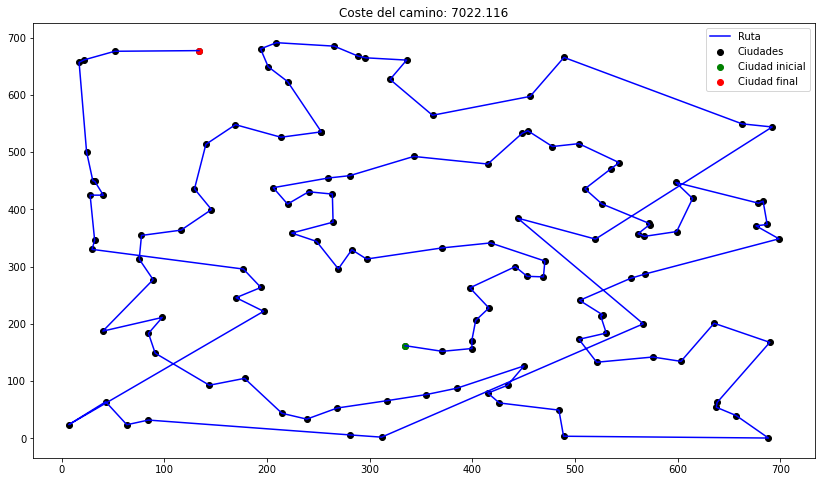

SH


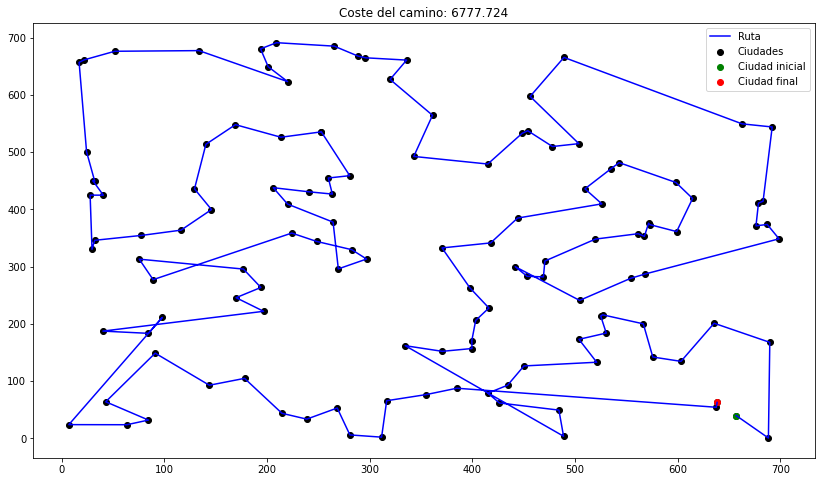

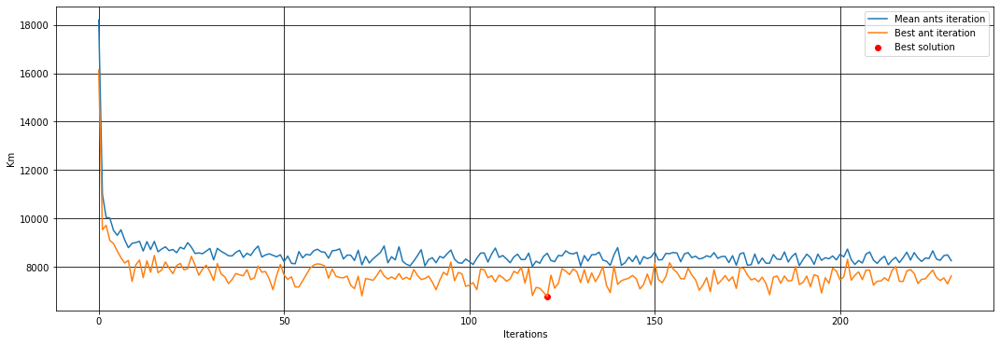

SHE


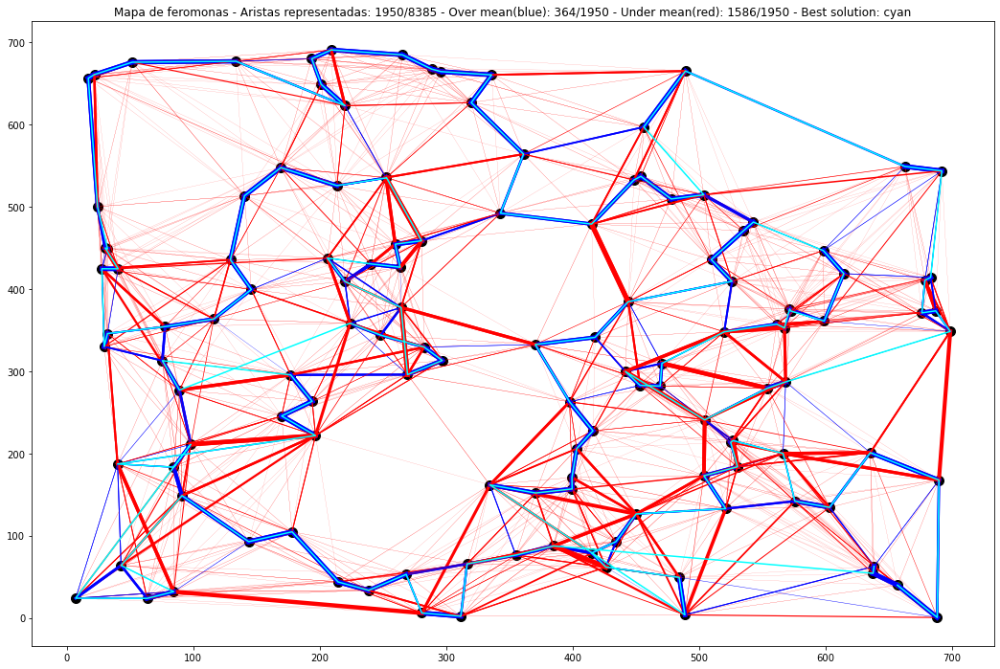

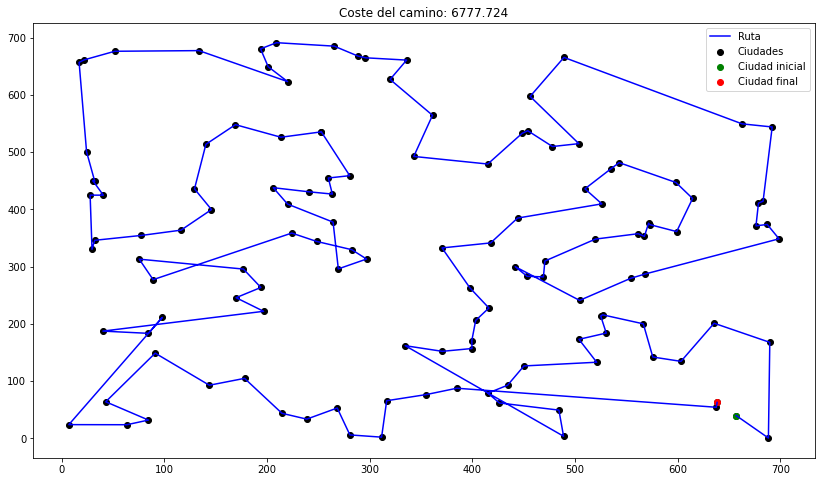

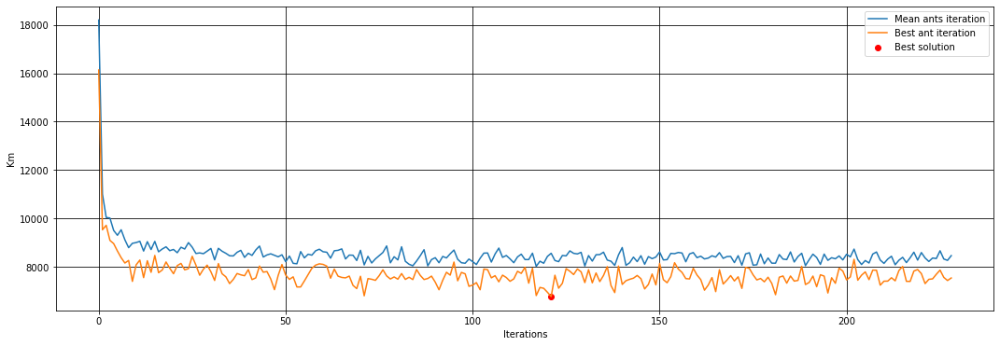

SCH


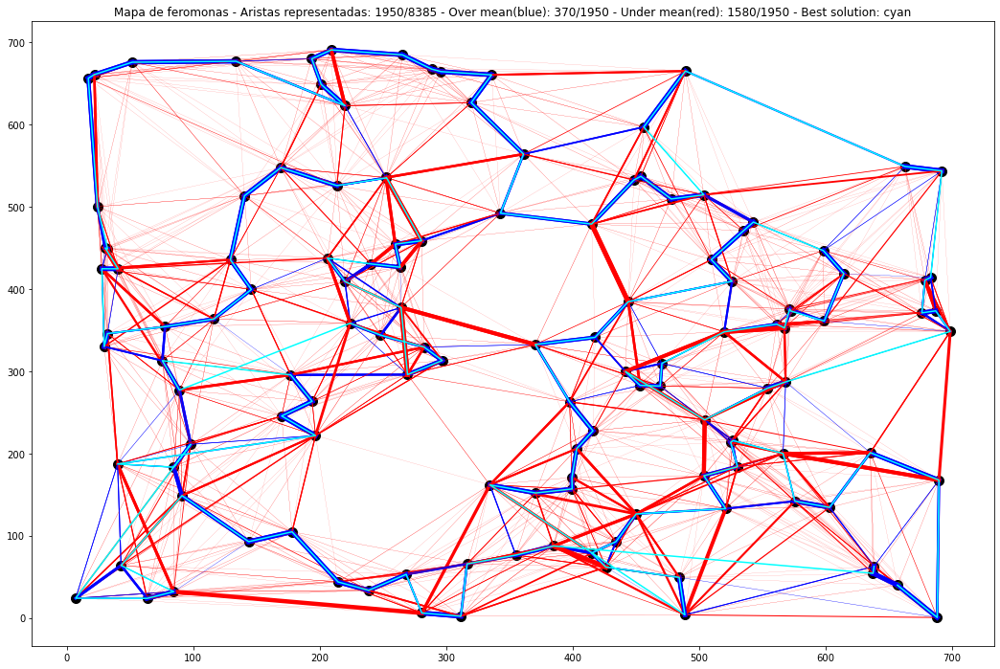

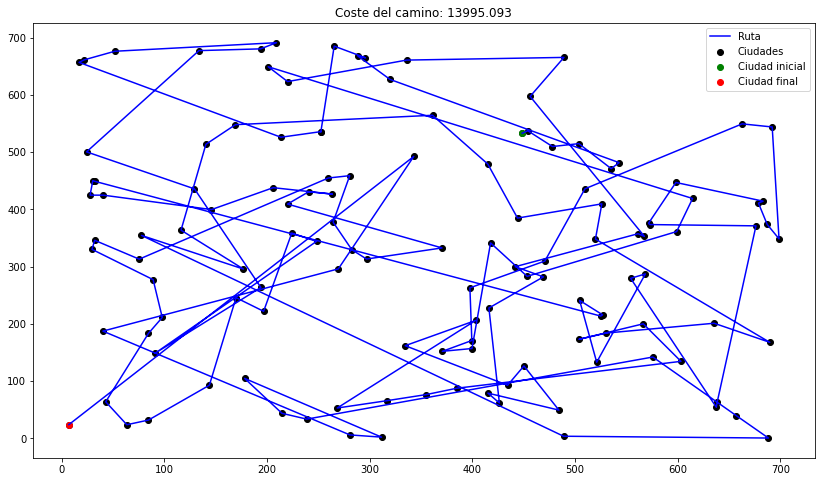

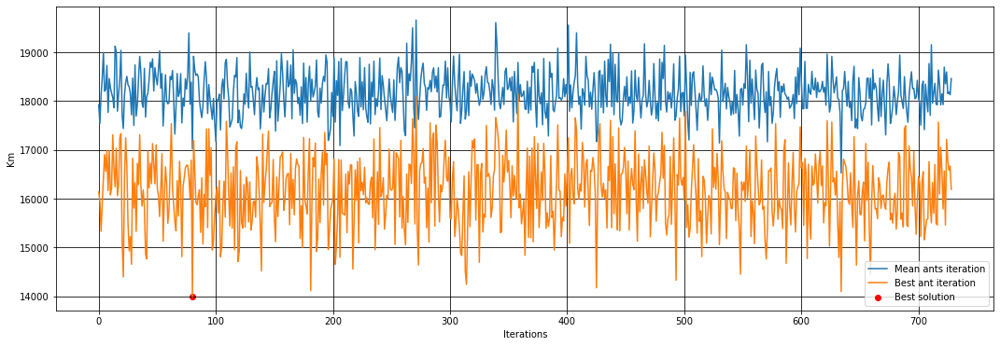

No se pudo representar las feromonas del algoritmo SCH

SEMILLA(1) - 55942876
Greedy


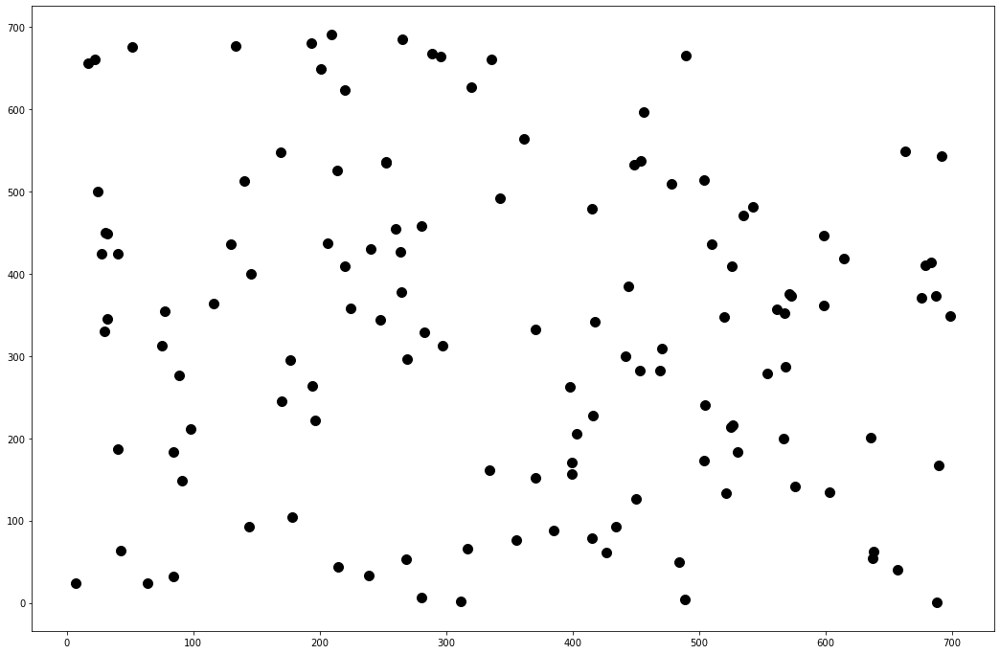

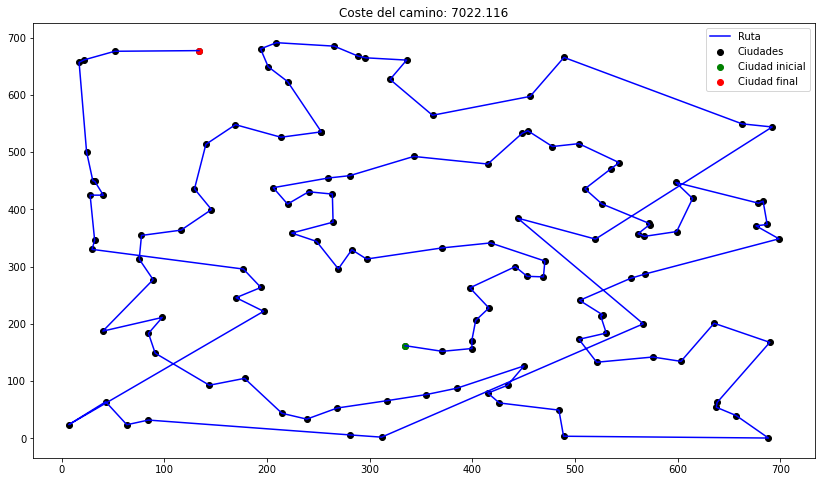

SH


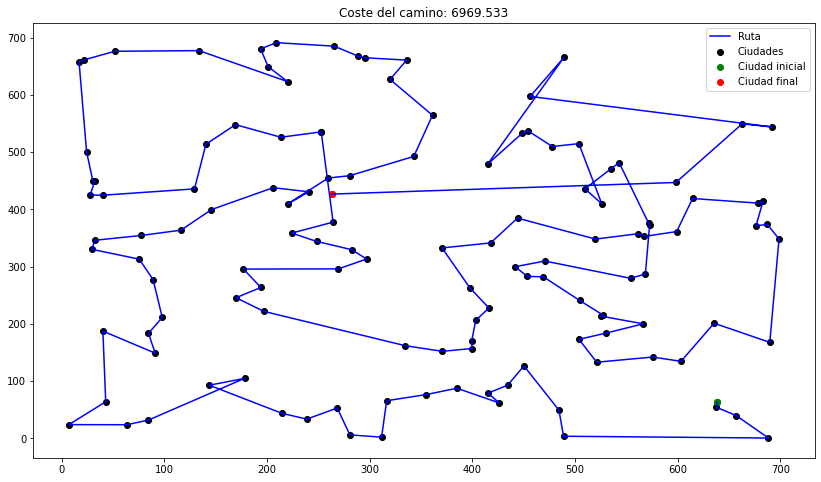

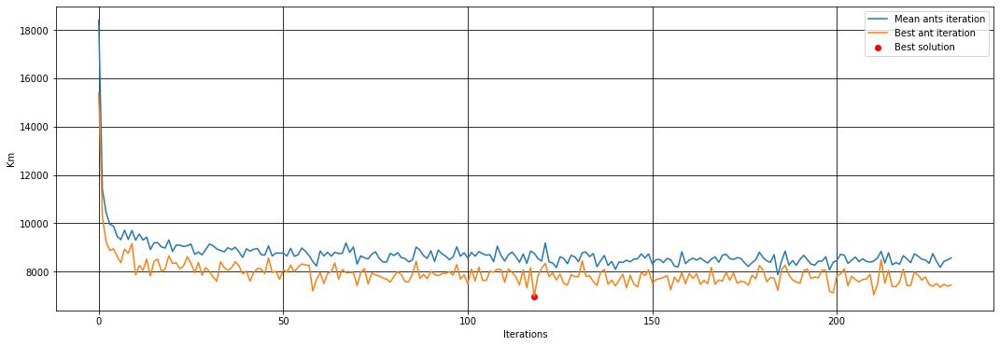

SHE


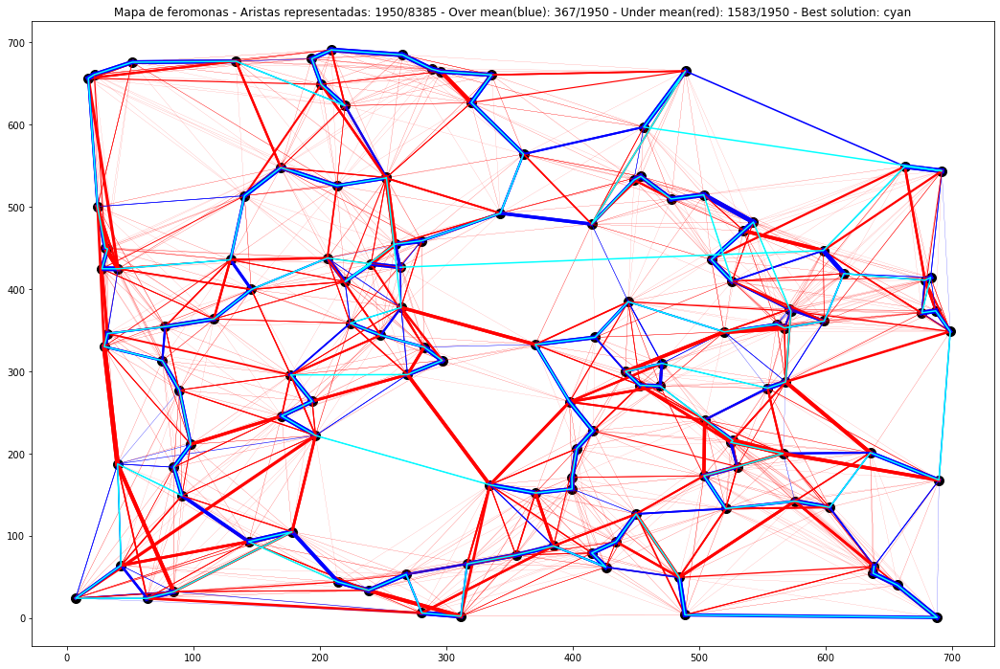

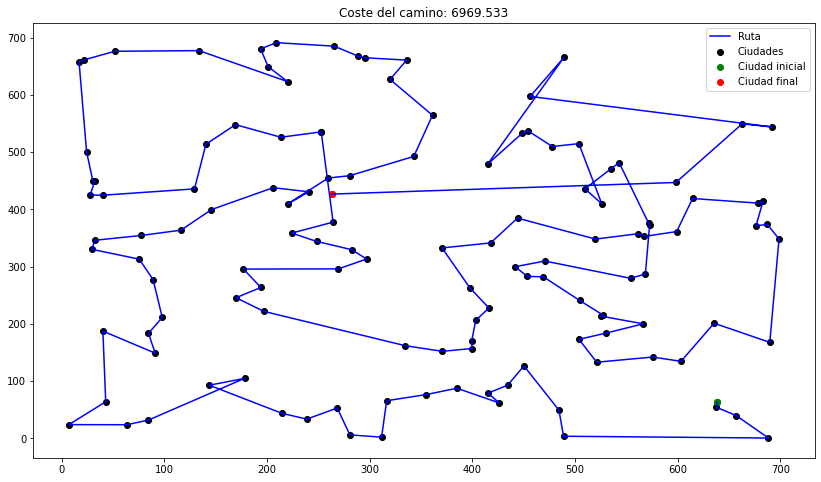

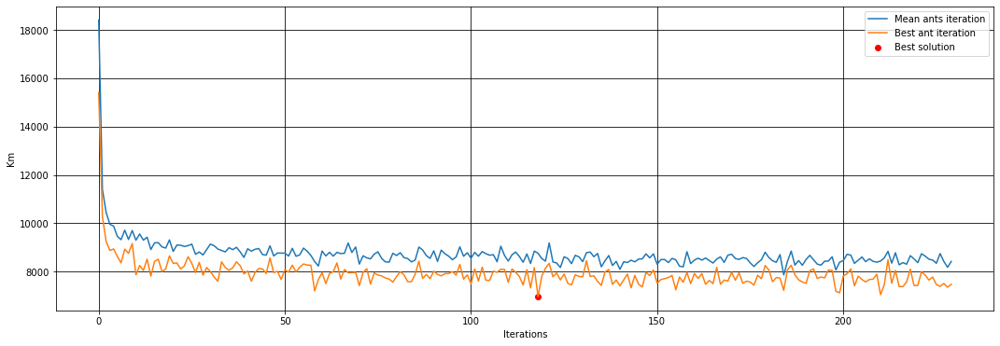

SCH


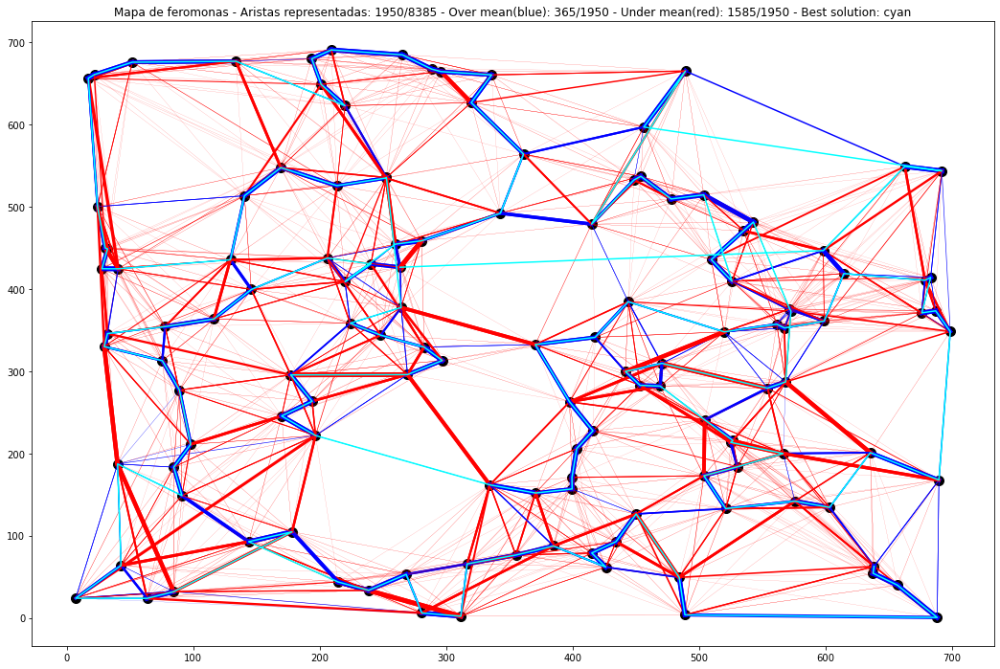

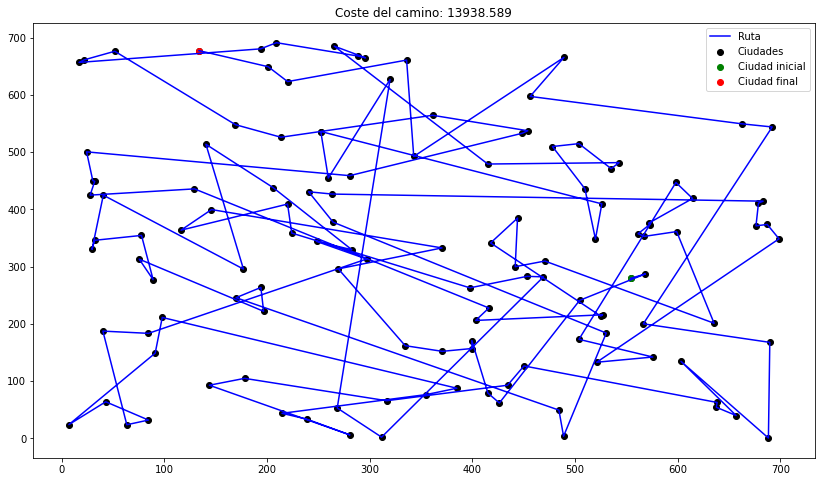

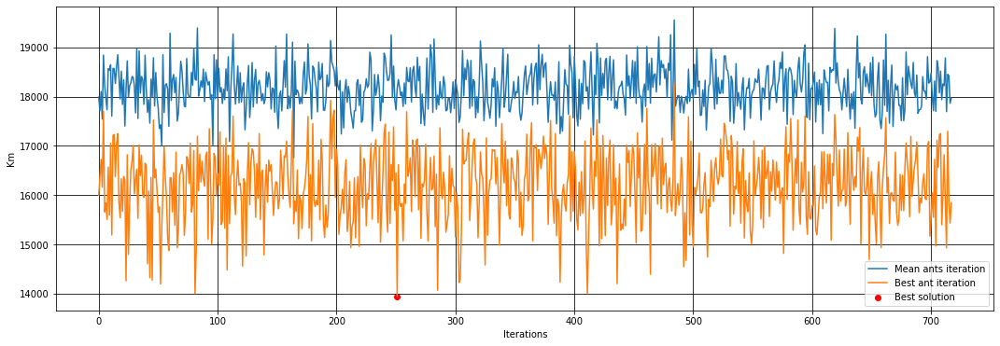

No se pudo representar las feromonas del algoritmo SCH

SEMILLA(2) - 148263551
Greedy


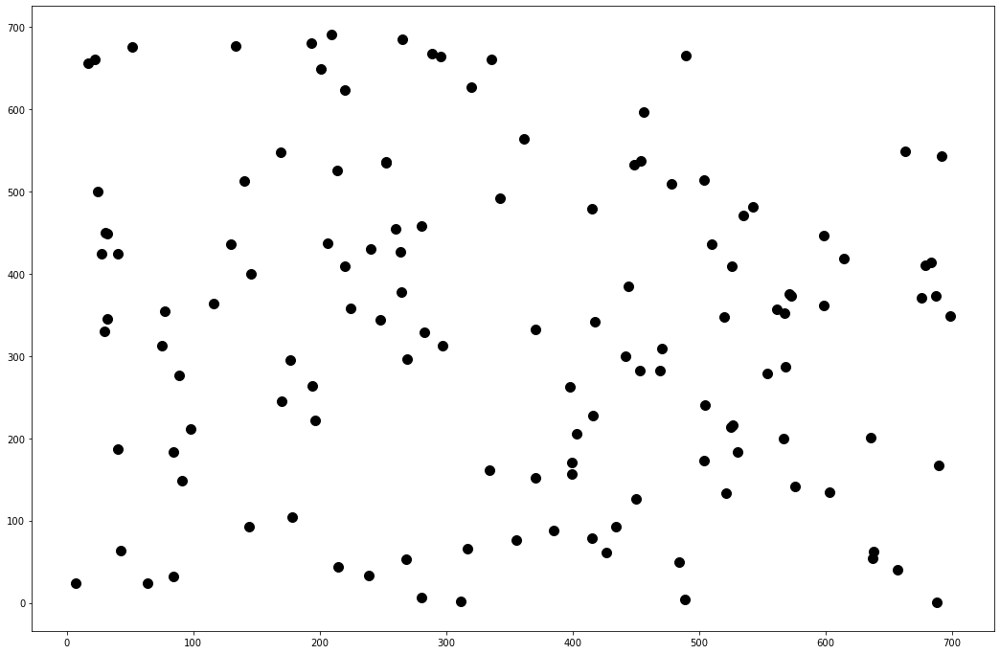

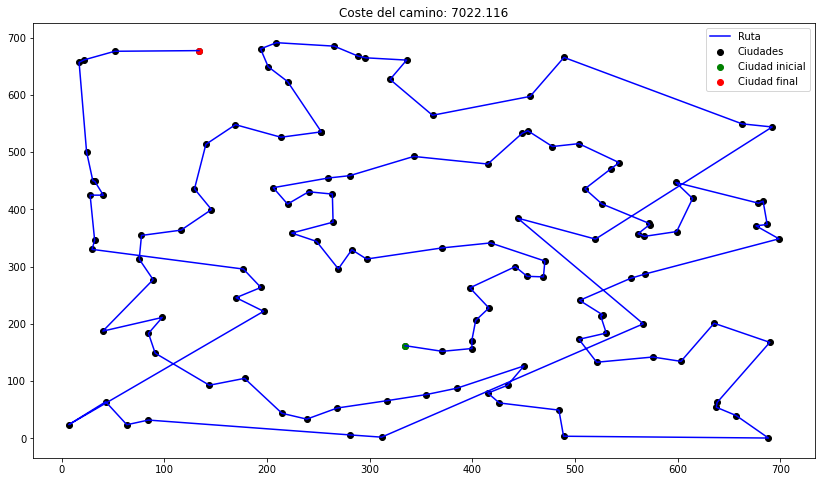

SH


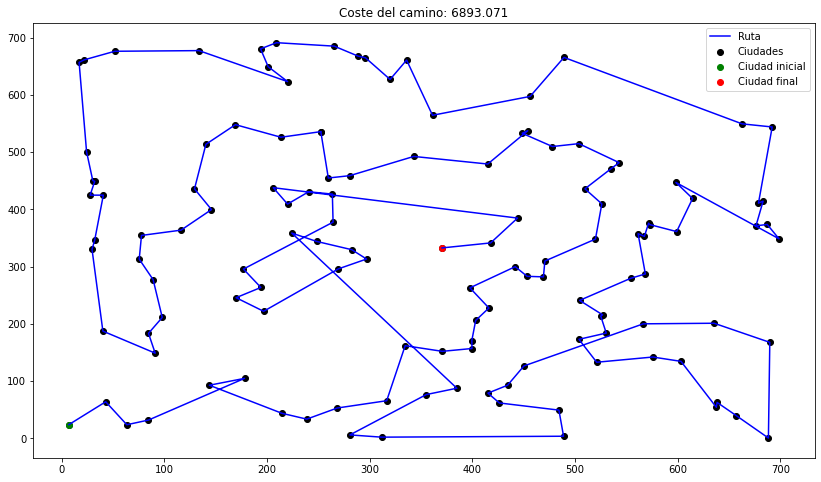

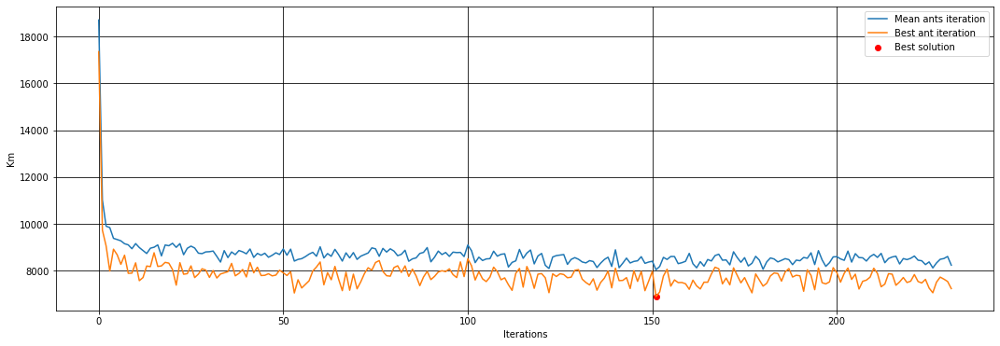

SHE


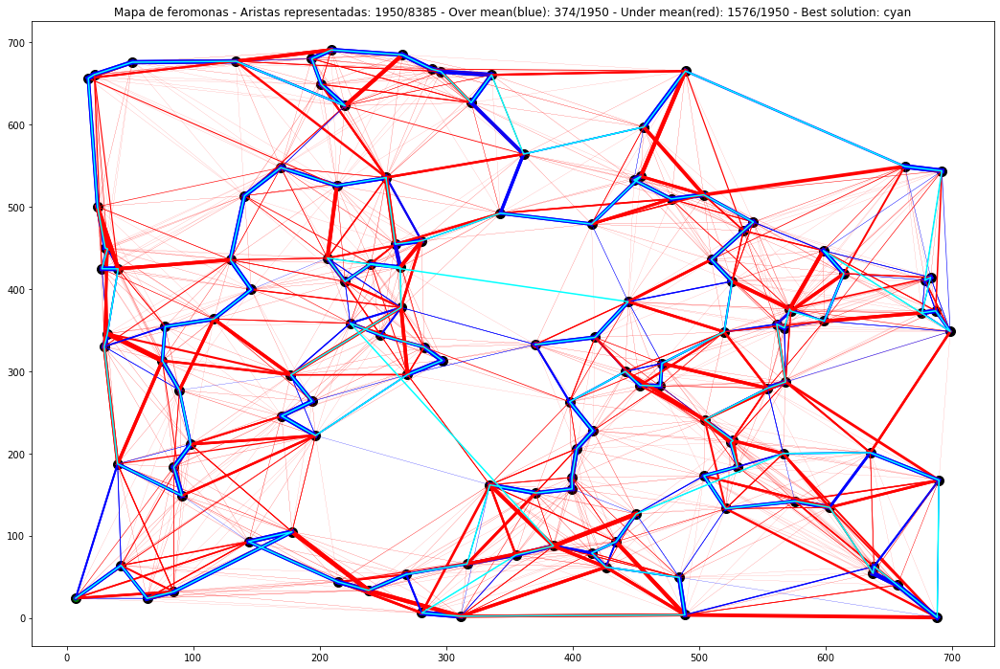

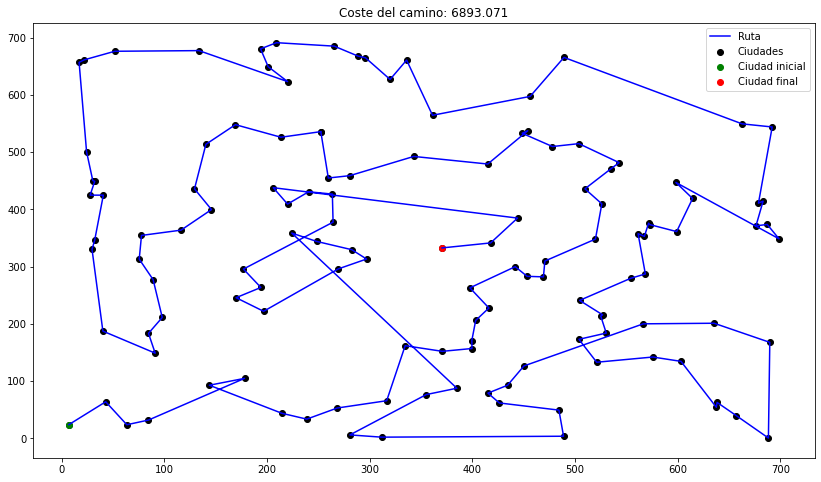

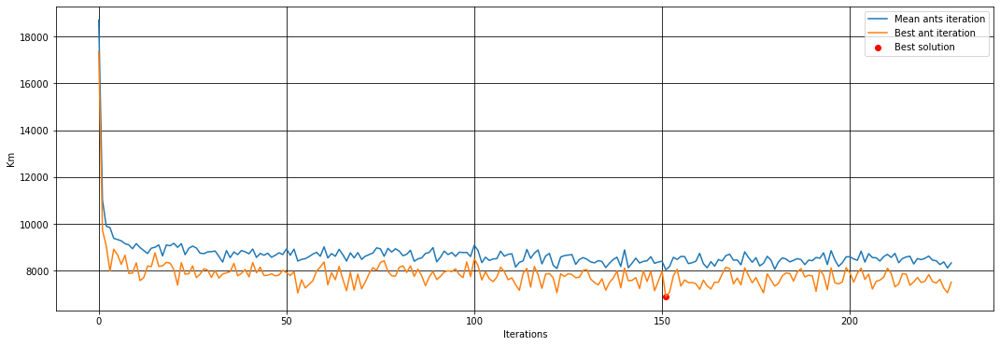

SCH


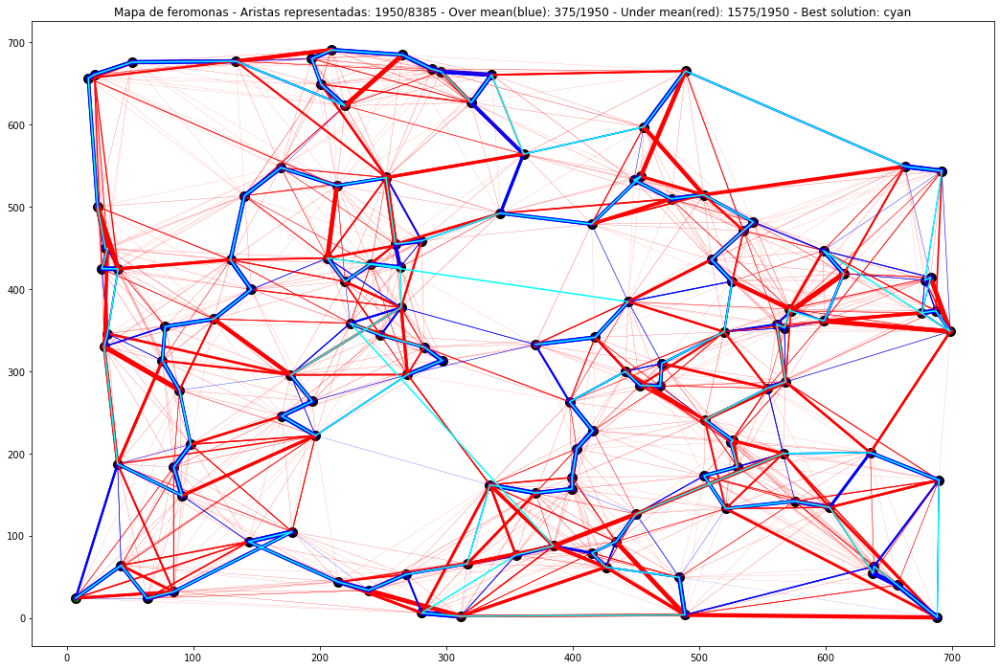

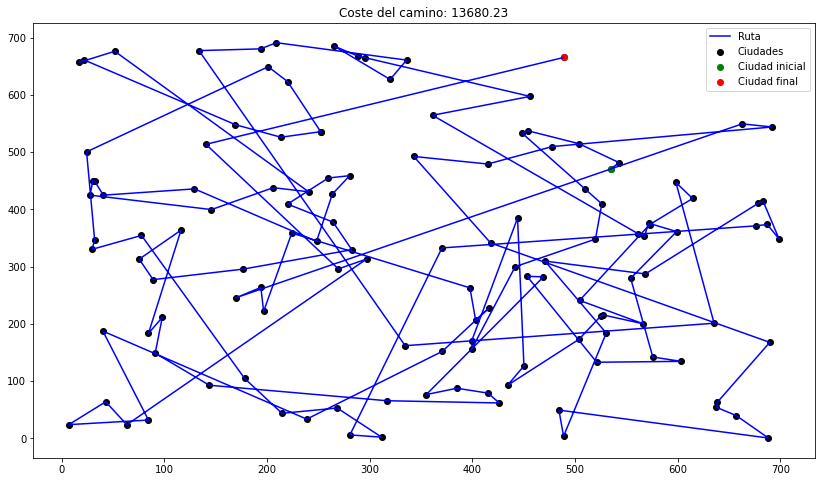

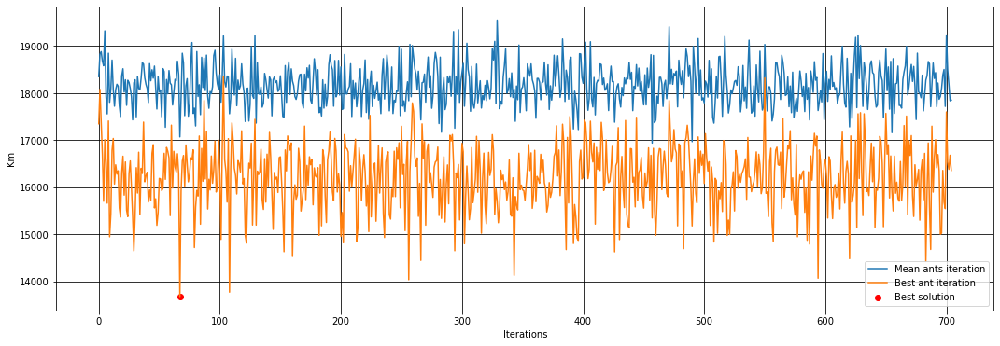

No se pudo representar las feromonas del algoritmo SCH

COMPLETADO
a280
SEMILLA(3) - 118643571
Greedy


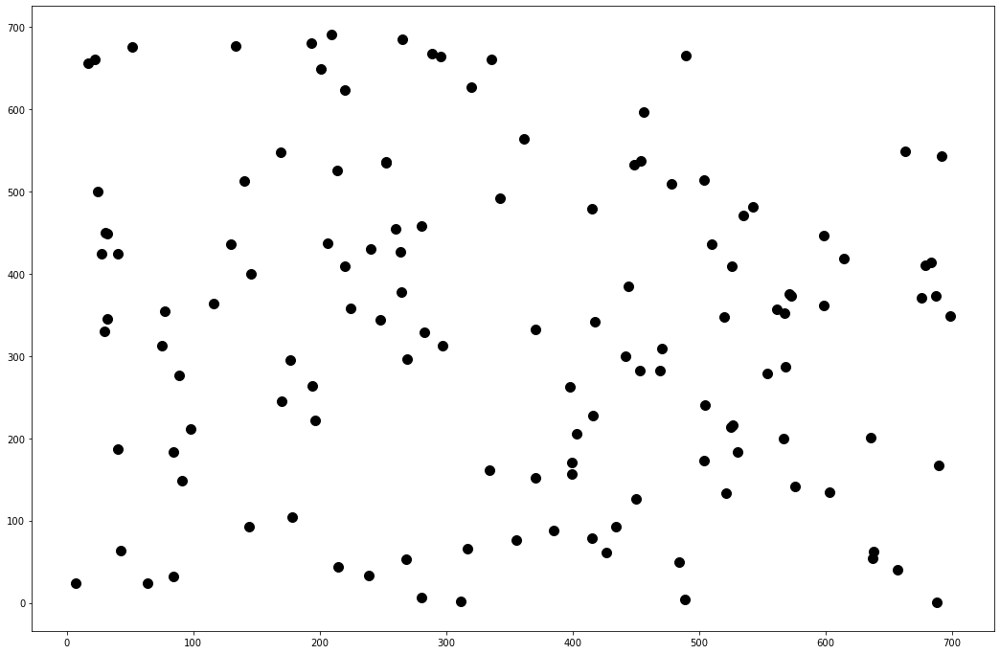

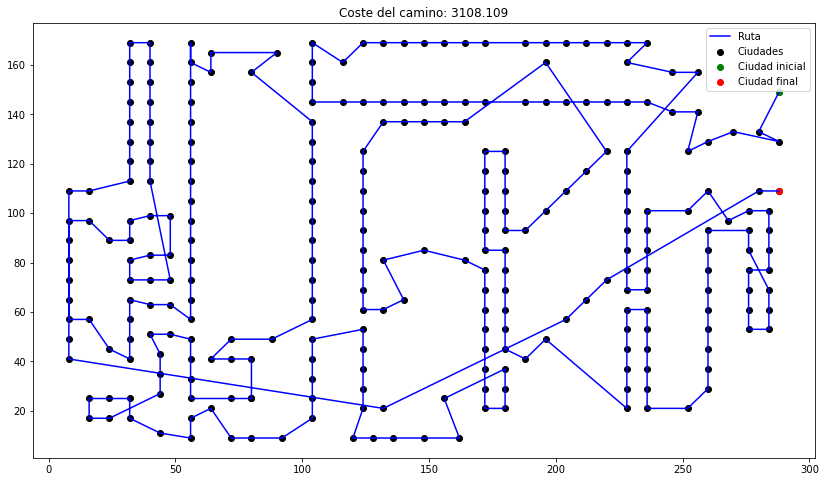

SH


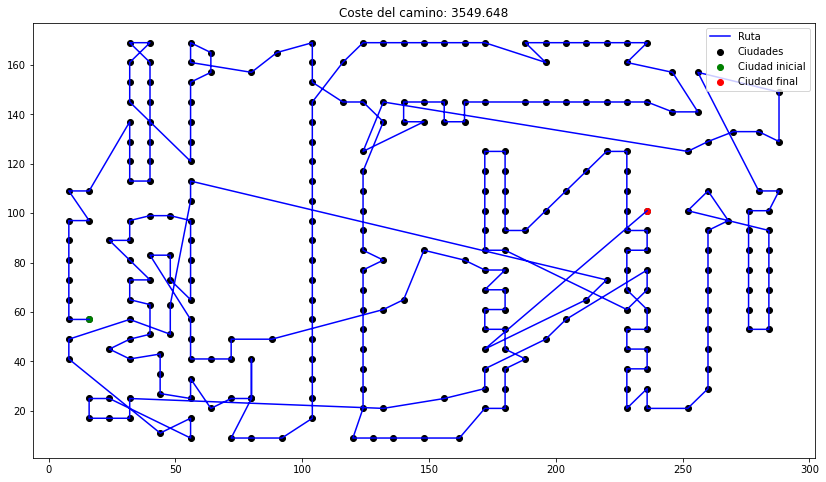

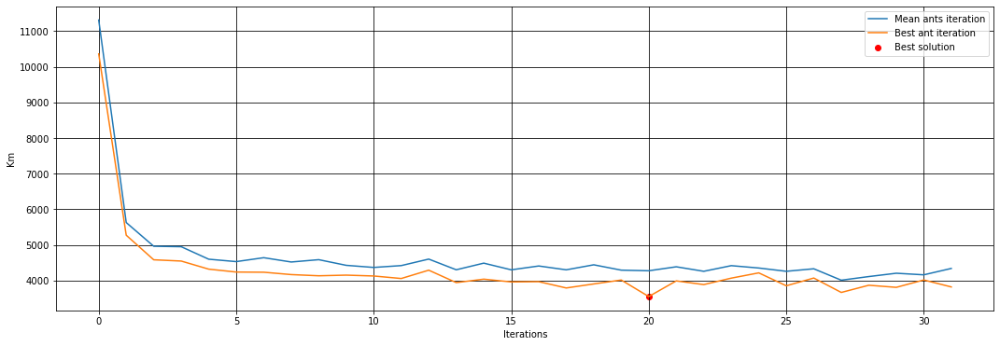

SHE


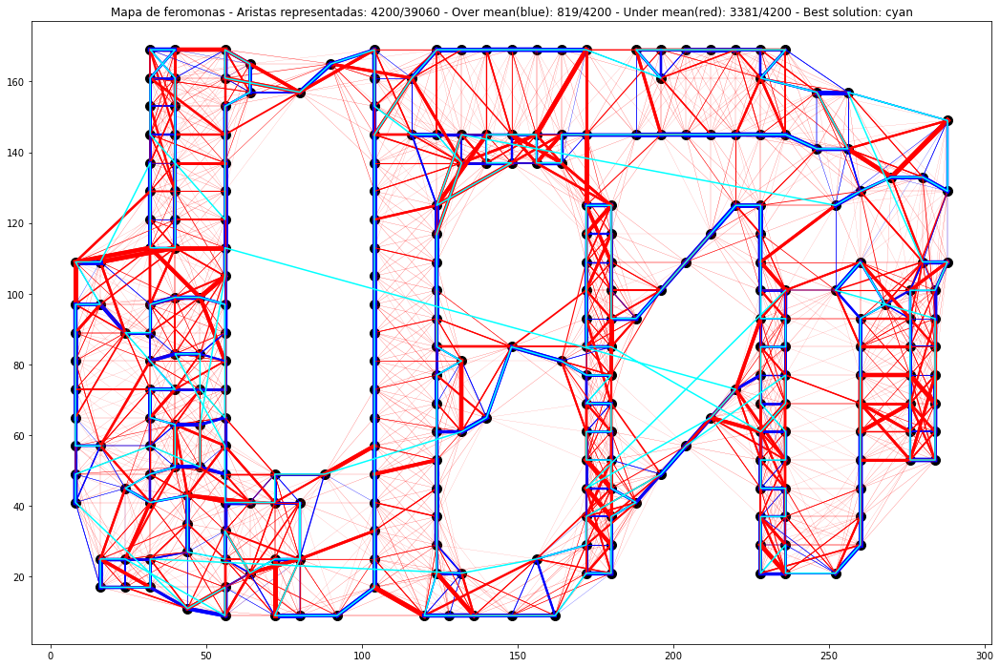

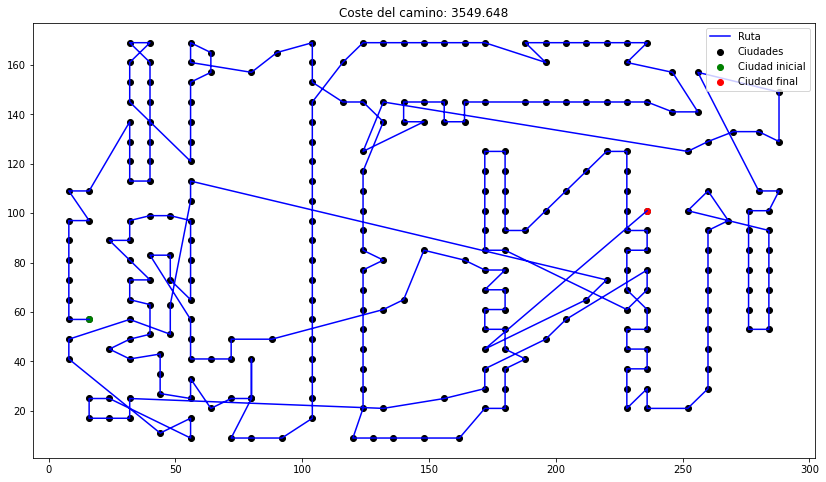

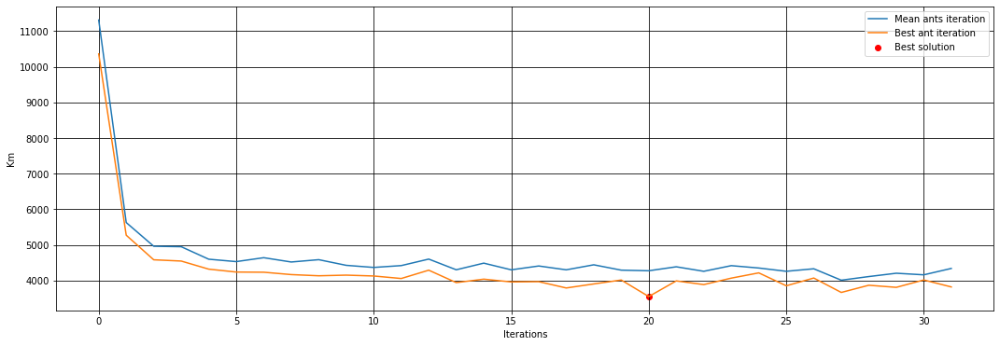

SCH


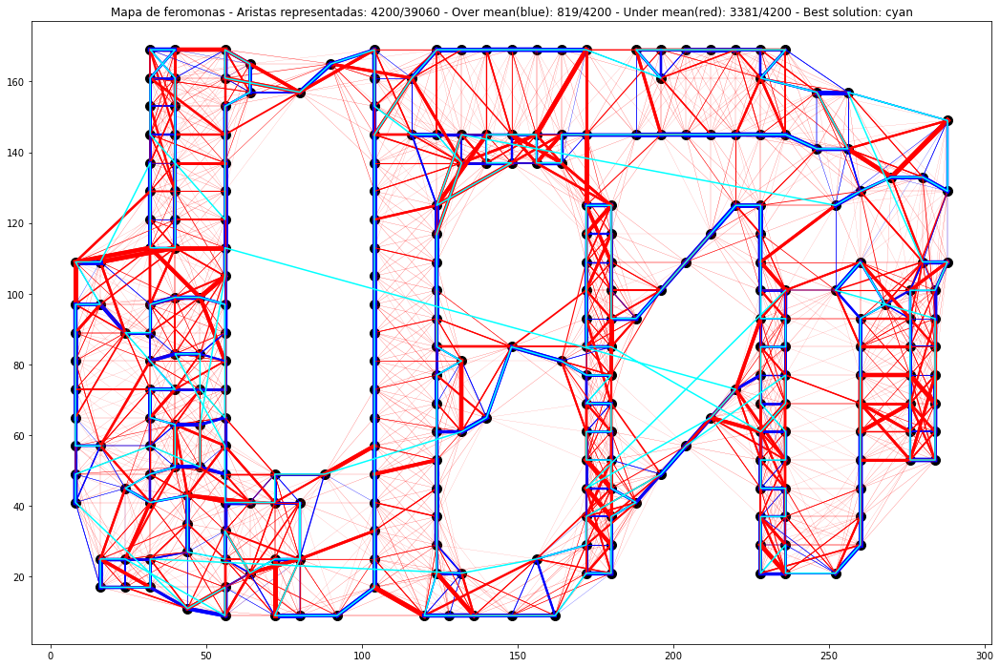

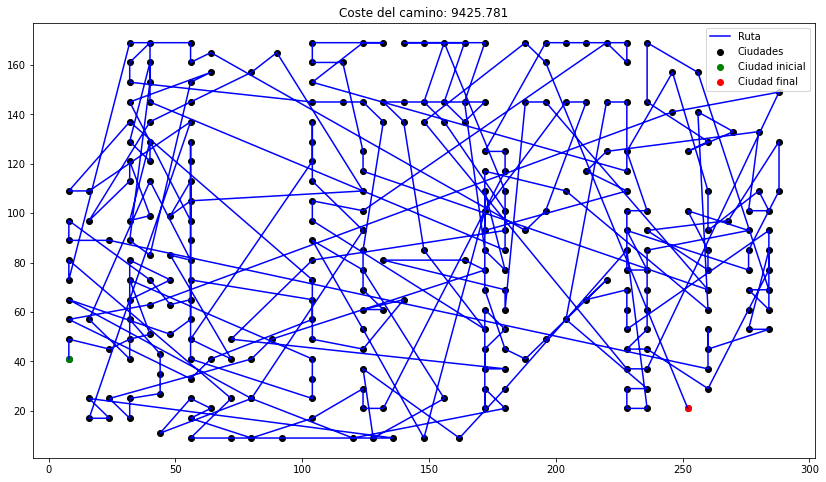

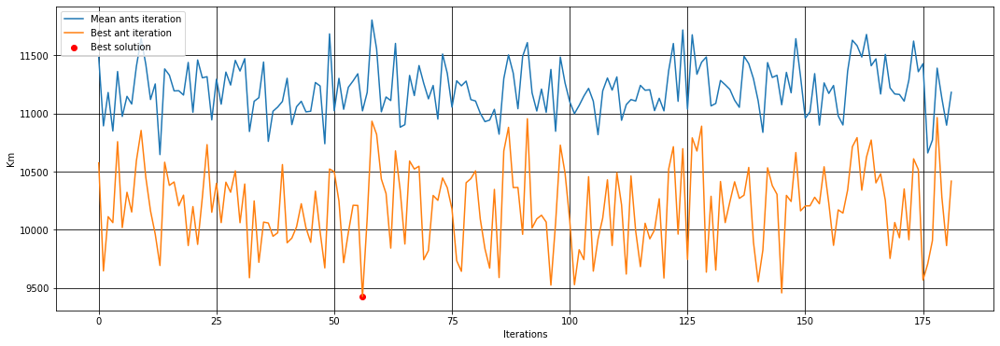

No se pudo representar las feromonas del algoritmo SCH

SEMILLA(4) - 55942876
Greedy


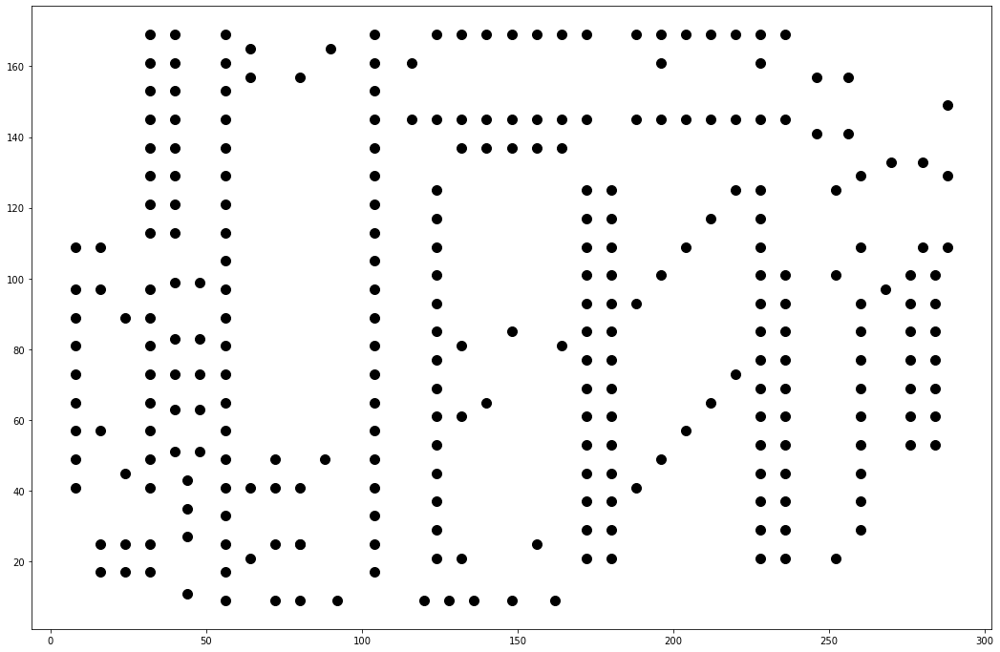

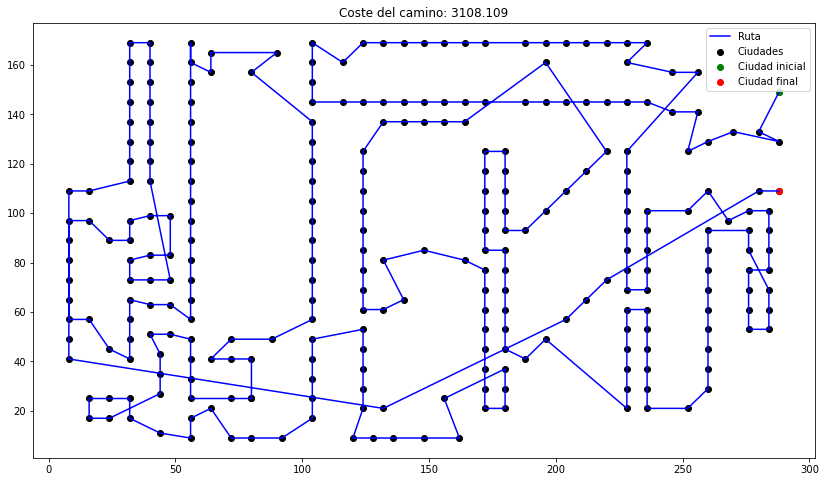

SH


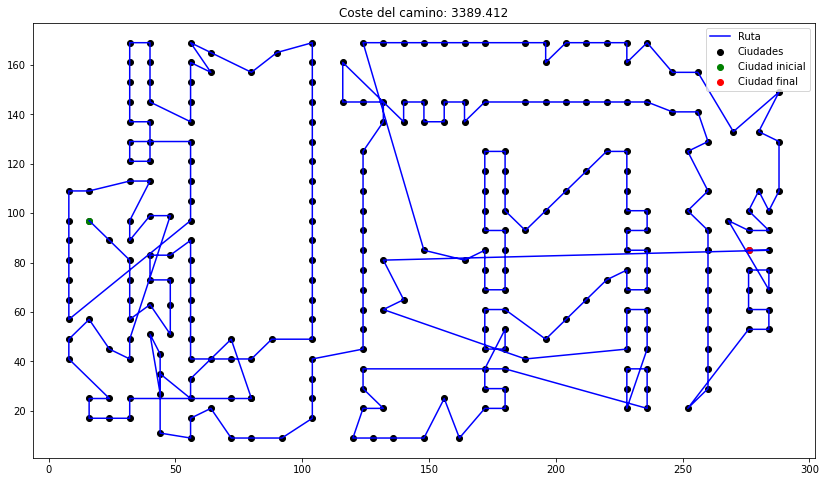

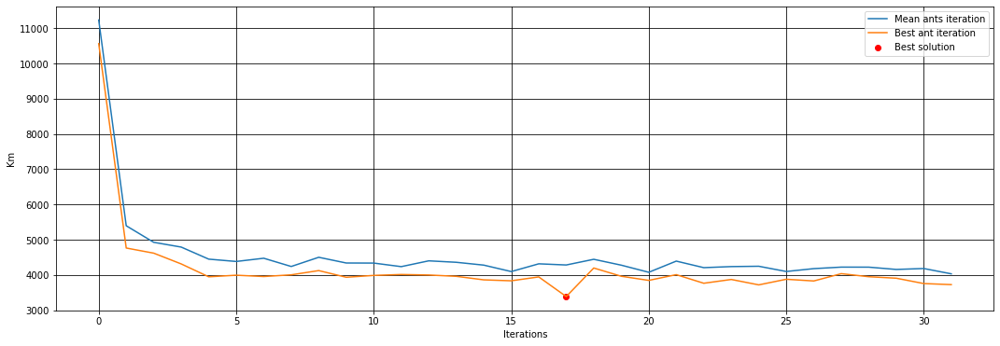

SHE


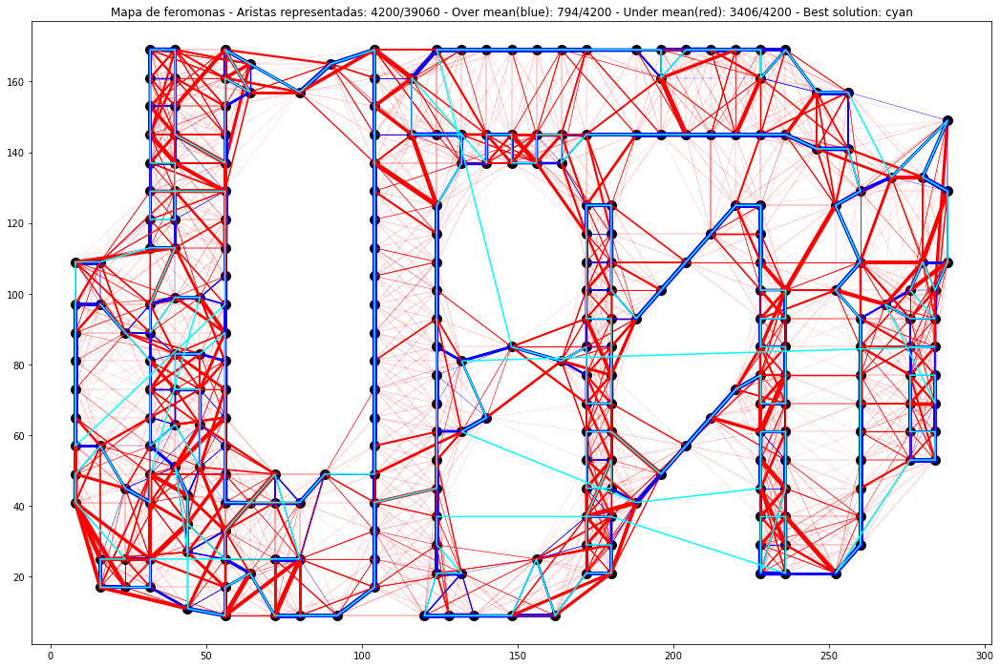

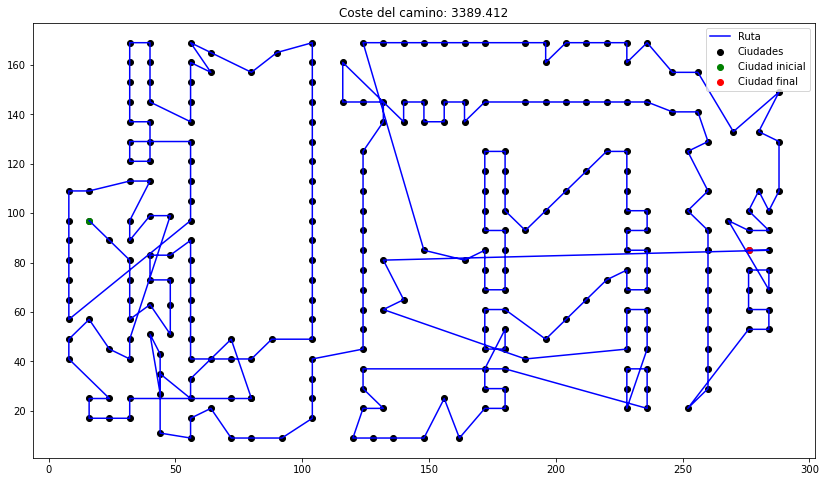

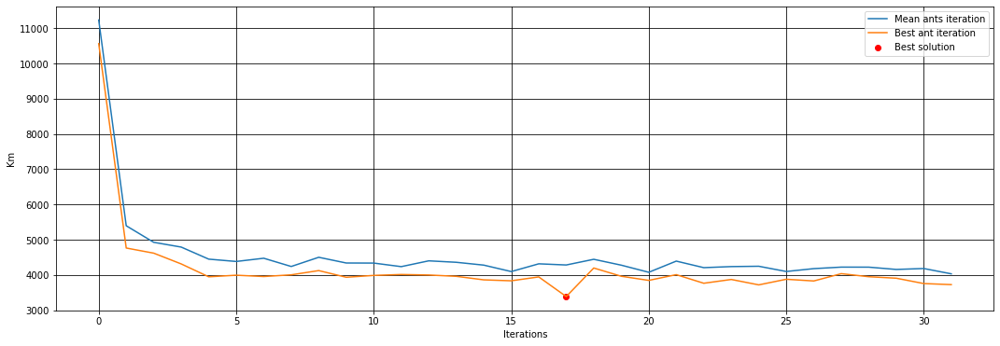

SCH


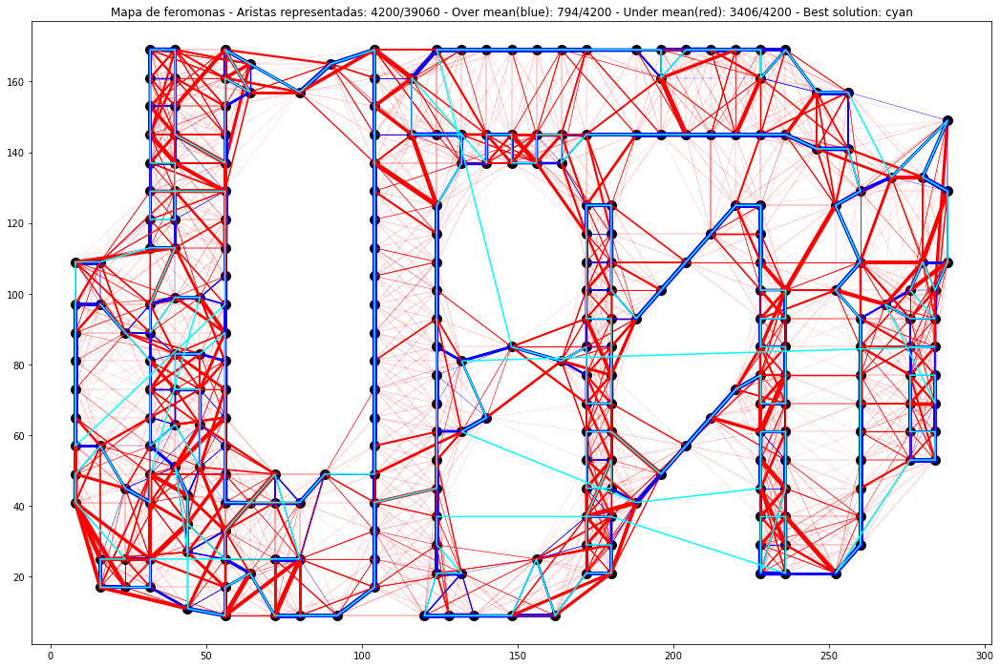

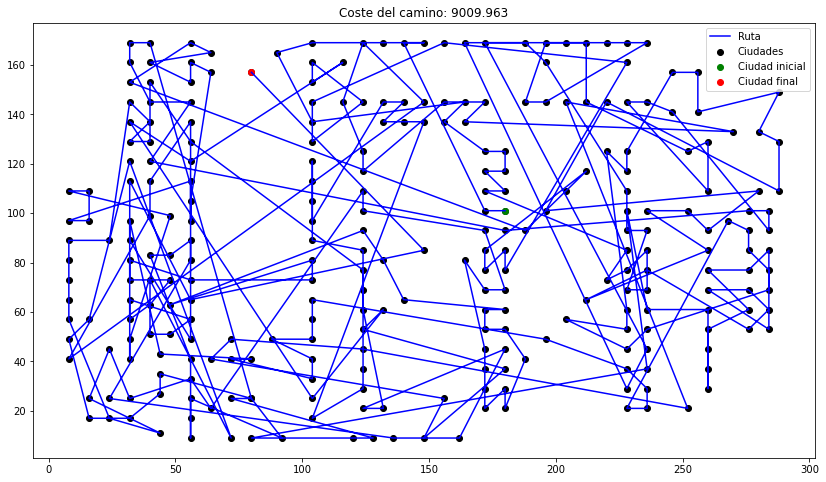

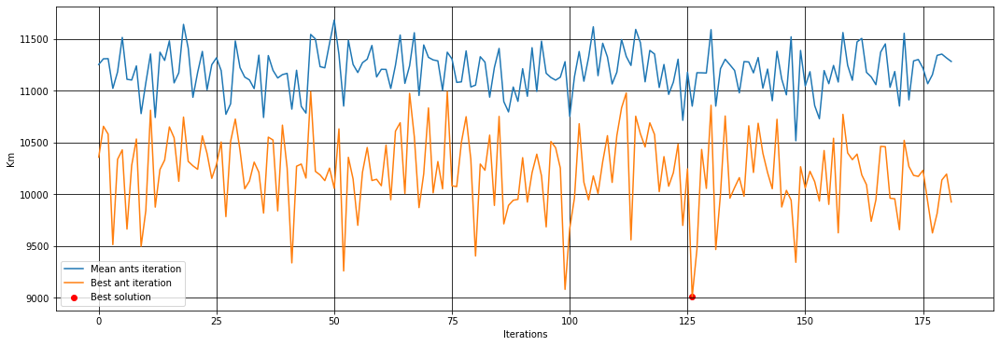

No se pudo representar las feromonas del algoritmo SCH

SEMILLA(5) - 148263551
Greedy


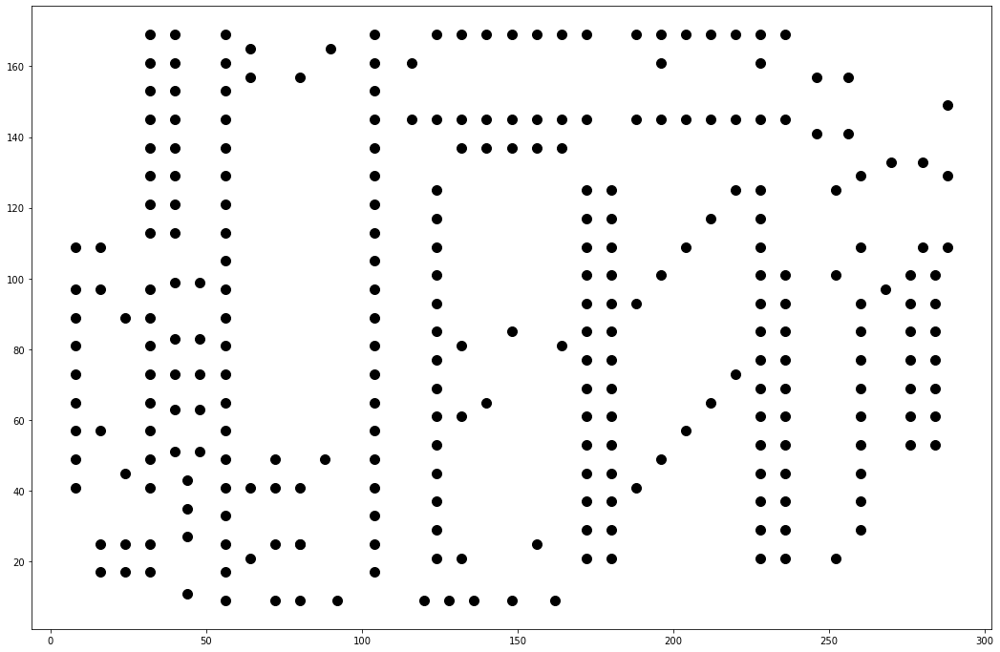

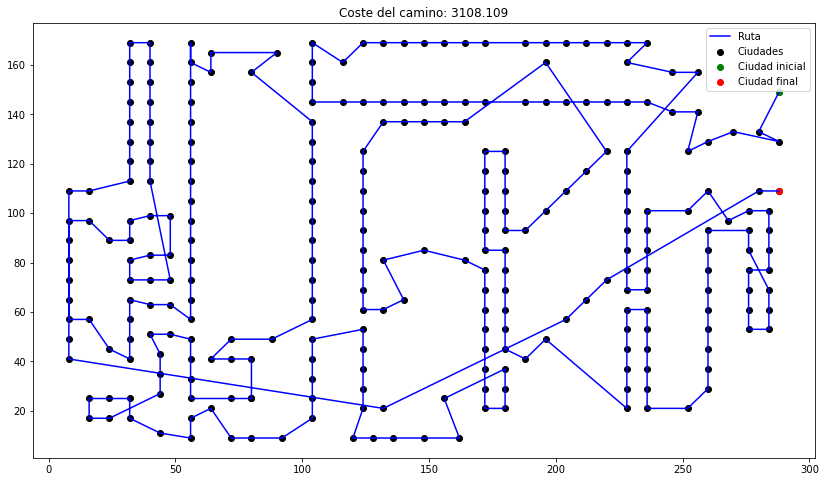

SH


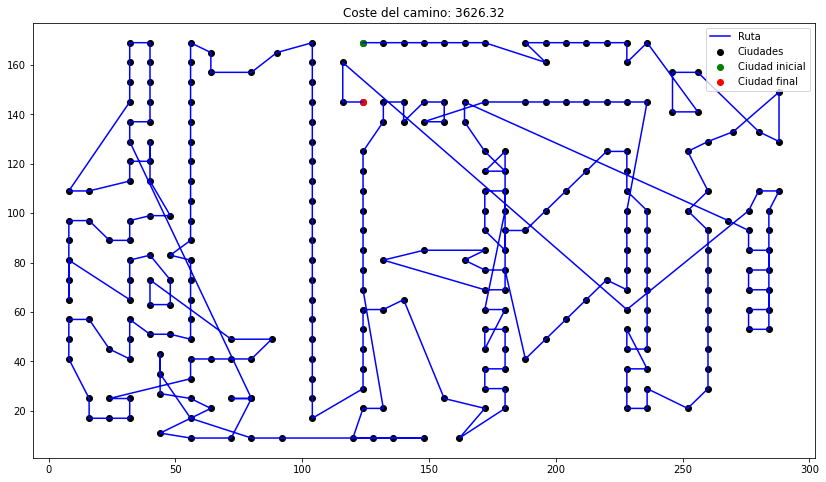

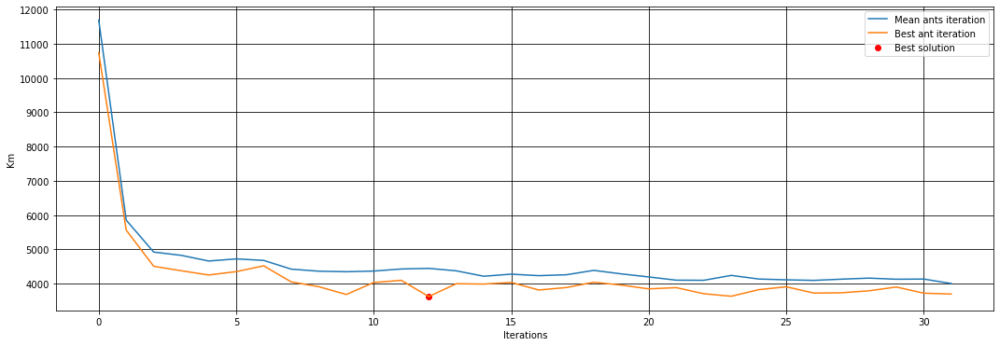

SHE


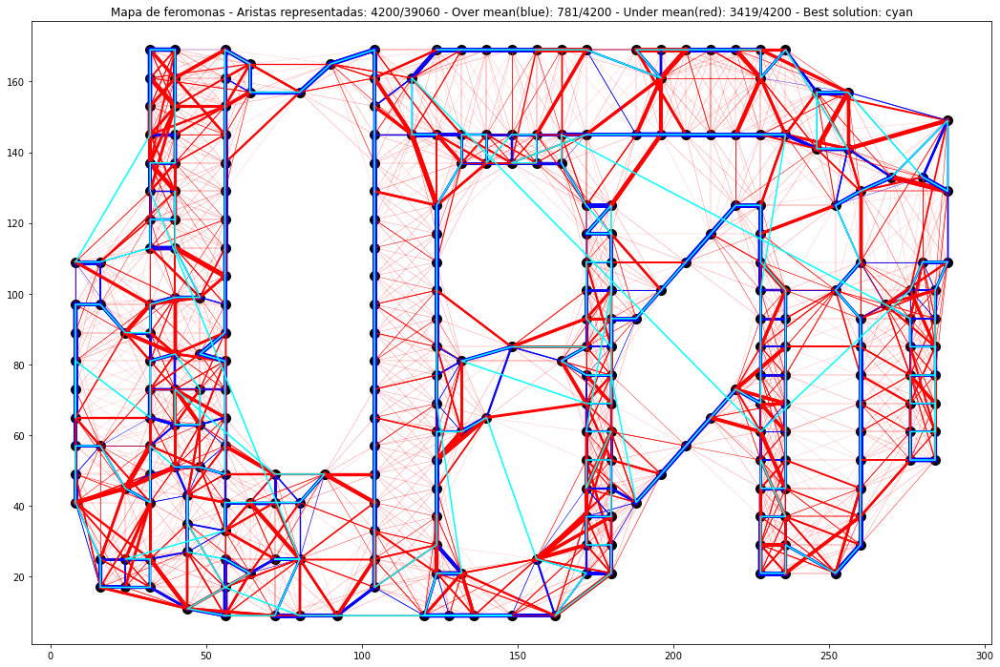

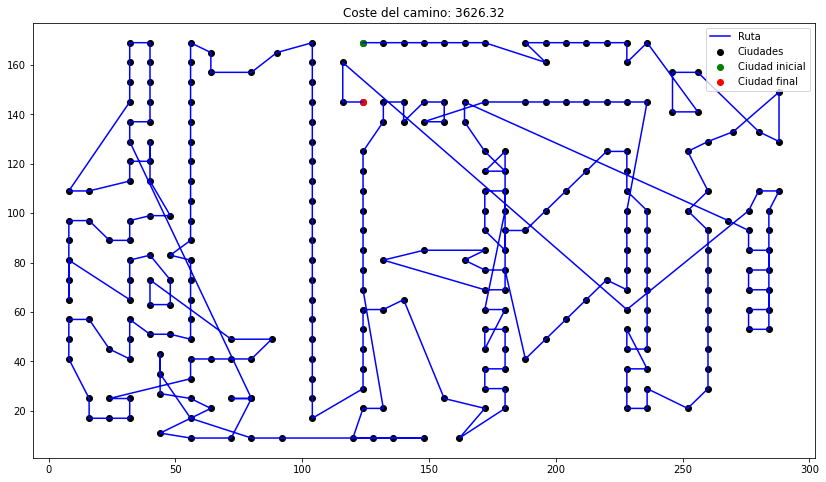

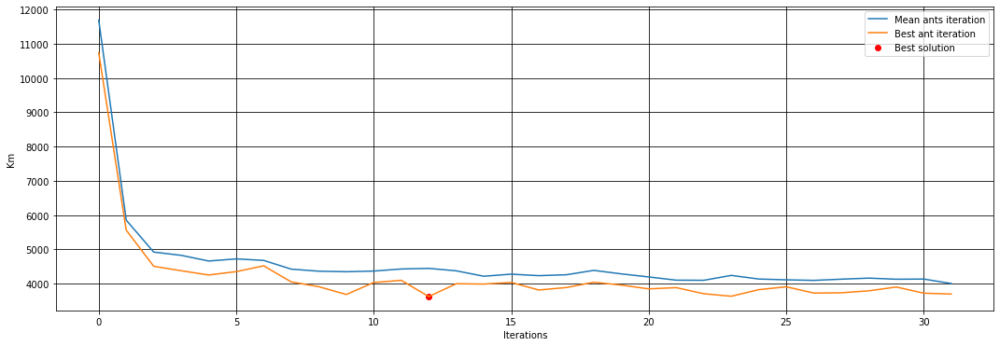

SCH


C:\Users\danie\AppData\Local\Temp/ipykernel_143404/3393710662.py:52: RuntimeWarning: invalid value encountered in double_scalars
  p += [(tau[i]**alpha * eta[i]**beta) / addition]


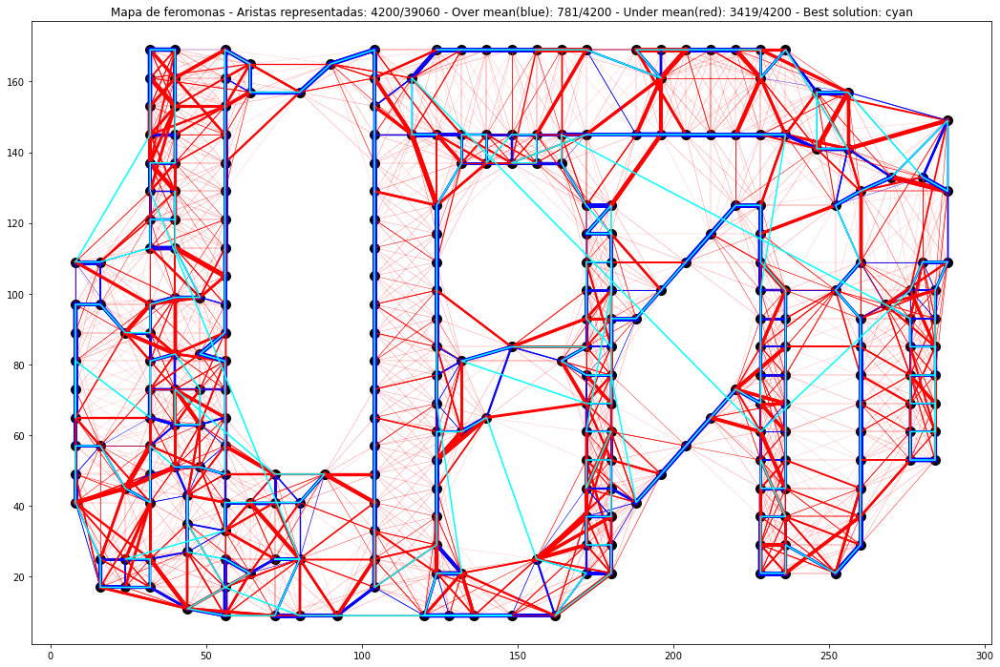

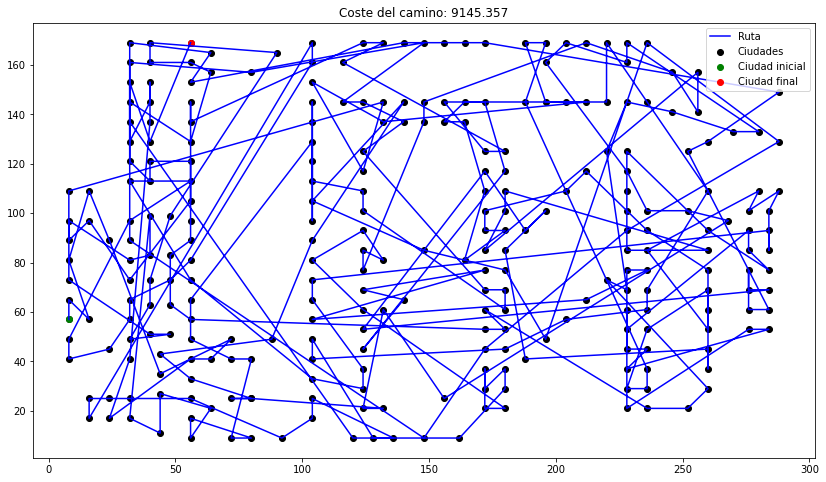

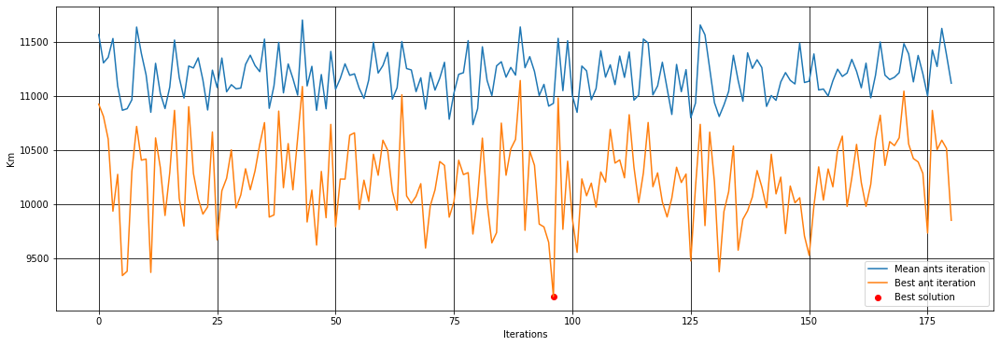

No se pudo representar las feromonas del algoritmo SCH

COMPLETADO


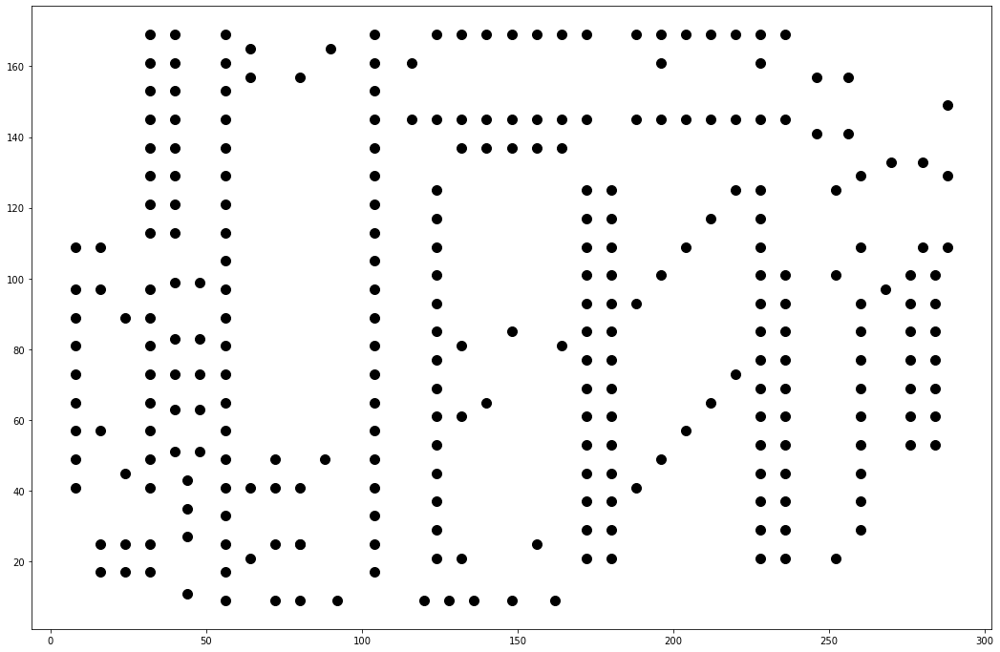

In [172]:
import numpy as np
import pandas as pd
import time
import datetime

seeds_df = pd.read_csv('./seeds/'+name_file+'.csv')
g_ch130 = nx.read_gpickle("./build_graph/graph_ch130.gpickle")
g_a280 = nx.read_gpickle("./build_graph/graph_a280.gpickle")
seeds = seeds_df.to_numpy()[:,1] # Semillas 

names_list = ['Greedy','SH','SHE','SCH']
cities = ['ch130','a280']

display = False # Muestra el progreso de cada algoritmo en profundidad

# Variables auxiliares
route = None
fitness = None
ev = None

solution_list = np.array([]) # Lista de kilometros
tkms_list = np.array([])

df_columns = ['Semilla', 'Algoritmo', 'Fitness', 'Evaluaciones', 'Solucion'] # Columnas del DataFrame

'''
ALGORITMOS
'''

i = 0
for city in cities:
    df = pd.DataFrame(columns=df_columns) # Dataframe que almacena toda la informacion
    df_path = './results/'+city+'_'+name_file+'.csv'

    print(city)
    if city == cities[0]:
        graph = g_ch130.copy()
    else:
        graph = g_a280.copy()
        
    for seed in seeds:
        print('SEMILLA({}) - {}'.format(i, seed))
    
        # GREEDY
        print(names_list[0])
        savefig = city+'_'+str(seed)+'_'+names_list[0]
        route, fitness, ev = greedy_test(seed,graph, savefig)
        df = update_dataframe(df, df_columns, seed, names_list[0], fitness, ev, route)

        # SH
        print(names_list[1])
        savefig = city+'_'+str(seed)+'_'+names_list[1]
        route, fitness, ev = sh_test(seed,graph, savefig, display)
        df = update_dataframe(df, df_columns, seed, names_list[1], fitness, ev, route)
        
        # SHE
        print(names_list[2])
        savefig = city+'_'+str(seed)+'_'+names_list[2]
        route, fitness, ev = she_test(seed,graph, savefig, display)
        df = update_dataframe(df, df_columns, seed, names_list[2], fitness, ev, route)

        # SCH
        print(names_list[3])
        savefig = city+'_'+str(seed)+'_'+names_list[3]
        route, fitness, ev = sch_test(seed,graph, savefig, display)
        df = update_dataframe(df, df_columns, seed, names_list[3], fitness, ev, route)

        print('')
        i += 1
        df.to_csv(df_path, index=False) # Guardamos el DataFrame


    print('COMPLETADO')

In [173]:
df = pd.read_csv('./results/ch130_seed.csv')
create_study(df,"ch130")
results = pd.read_csv('./study/ch130_Global_results.csv')
results

Estudio finalizado


,Algoritmo,Ev. Medias,Ev. Mejor,Desviacion tipica Ev,Mejor Fitness,Media Fitness,Desviacion tipica Fitness
0,Greedy,1.000000,1,0.000000,7022.116,7022.116000,9.094947e-13
1,SH,2316.666667,2310,4.714045,6777.724,6880.109333,7.884025e+01
2,SHE,2290.000000,2280,8.164966,6777.724,6880.109333,7.884025e+01
3,SCH,7173.333333,7050,98.092926,13680.230,13871.304000,1.370648e+02


In [174]:
df = pd.read_csv('./results/a280_seed.csv')
create_study(df,"a280")
results = pd.read_csv('./study/a280_Global_results.csv')
results

Estudio finalizado


,Algoritmo,Ev. Medias,Ev. Mejor,Desviacion tipica Ev,Mejor Fitness,Media Fitness,Desviacion tipica Fitness
0,Greedy,1.000000,1,0.000000,3108.109,3108.109000,0.000000
1,SH,320.000000,320,0.000000,3389.412,3521.793333,98.702455
2,SHE,320.000000,320,0.000000,3389.412,3521.793333,98.702455
3,SCH,1816.666667,1810,4.714045,9009.963,9193.700333,173.164586
